In [4]:
import numpy as np
import matplotlib.pyplot as plt


# from datamanagement import SlabFile
import os
import datetime
from time import *
#from slab import *
# from handy import prev_data
import sys 
project_path = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
print(project_path)
sys.path.append(project_path)
#new_path = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/materials-software/'
new_path = r'G:/My Drive/Projects/Materials/materials-software/'

sys.path.append(new_path)
%load_ext autoreload
%autoreload 2



# add the following path to sys.path
path_of_meas_directory = r'/Users/eesh/Documents/'
sys.path.append(path_of_meas_directory)
import scresonators

path_of_directory = r'/Users/eesh/Documents/scresonators/measurement'
sys.path.append(path_of_directory)
import vna_scan as vna_measurement


path_of_directory = r'/Users/eesh/Documents/multimode_expts/vna_experiments'
sys.path.append(path_of_directory)
from ZNB import ZNB20


/Users/eesh/Documents/multimode_expts
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
base_path = r'G:\Shared drives\SLab\Multimode\LinearMultimode\measurements\vna_meas_251018'
if not os.path.exists(base_path):
    os.makedirs(base_path)

# Utilities

In [6]:
VNA = ZNB20(address='10.108.30.65') # Stanford
#VNA = ZNB20(address='192.168.137.84') # SLAC

## Daily measurement settings
warm_att = 0 #dB
cold_att = 60

In [7]:
def read_s2p_to_data(file_path, power_at_device=-50):
    s2p_data = []
    with open(file_path, 'r') as f:
        s2p_data = f.readlines()
    freqs = []
    amps = []
    phases = []
    for line in s2p_data:
        if line.startswith('!') or line.startswith('#'):
            continue
        parts = line.strip().split()
        if len(parts) >= 5:
            freq = float(parts[0])
            amp = float(parts[3])  # S21 amplitude in dB
            phase = float(parts[4])  # S21 phase in degrees
            freqs.append(freq)
            amps.append(amp)
            phases.append(phase)
    freqs = np.array(freqs)
    amps = np.array(amps)
    phases = np.array(phases)
    data = {
        "series": list(range(len(freqs))),
        "amps": amps,
        "phases": phases * np.pi / 180,  # convert degrees to radians
        "freqs": freqs,
        "vna_power": None,
        "power_at_device": power_at_device,
        "bandwidth": None,
        "averages": None,
        "npoints": len(freqs),
    }
    return data

## Check if VNA responds

In [16]:
VNA.get_frequencyspan()

'10000000\n'

In [21]:
VNA.set_frequencyspan(1e2)  # 10 MHz span

In [22]:
VNA.get_frequencyspan()

'1000000\n'

In [28]:
data = VNA._get_data(trace='S21')

shape of val: (20002,)


In [29]:
data

(array([-inf, -inf, -inf, ..., -inf, -inf, -inf]),
 array([0., 0., 0., ..., 0., 0., 0.]))

# Ultra Wide scan

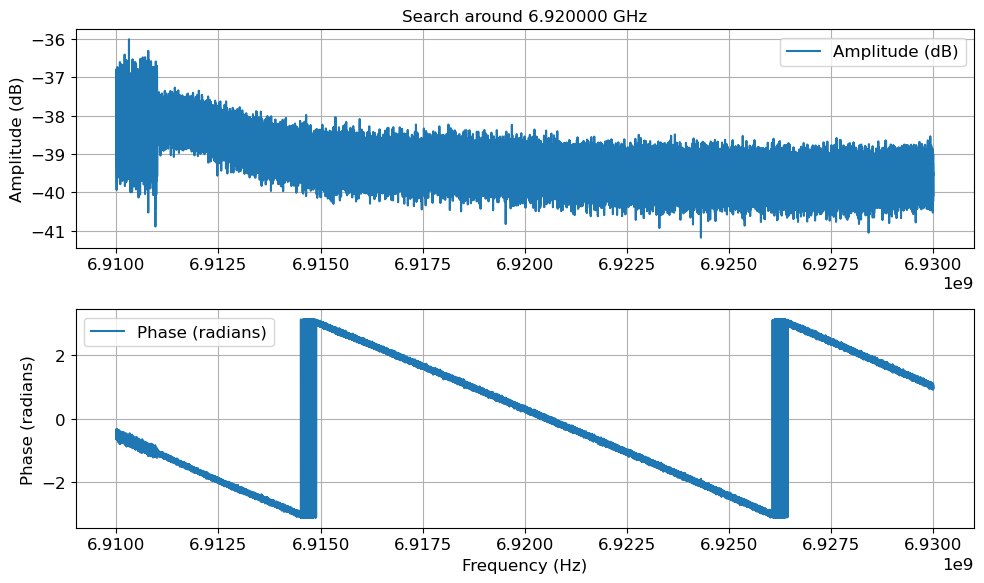

In [ ]:
# [6.1317482
# 6.3173993
# 6.5113892
# 6.7071663
# 6.9206804]
# above are predicted freq centers, 
# do 5MHz search around these frequencies, each scan being 1 mhz in span with 1000 bw and 5 avgs 
predicted_freqs = [4.808e9]#[6.1317482e9, 6.3173993e9, 6.5113892e9, 6.7071663e9, 6.9206804e9]
search_span = 20e6
scan_span = 1e6
bandwidth = 1000
avgs = 5
npoints = 10001
power = -30

import matplotlib.pyplot as plt

for center in predicted_freqs:
    scan_centers = np.arange(center - search_span/2 + scan_span/2, center + search_span/2, scan_span)
    all_freqs = []
    all_amps = []
    all_phases = []
    for i, freq_center in enumerate(scan_centers):
        scan_def = {
            'freq_center': freq_center,
            'span': scan_span,
            'bandwidth': bandwidth,
            'power': power,
            'npoints': npoints,
            'averages': avgs,
            'spar': 'S21'
        }
        file_name = f'pred_scan_{int(center)}_{i}'
        data = vna_measurement.do_vna_scan(VNA, file_name, base_path, scan_def, plot=False)
        all_freqs.append(data['freqs'])
        all_amps.append(data['amps'])
        all_phases.append(data['phases'])
    # Plot amplitude and phase for this predicted frequency
    plt.figure(figsize=(10, 6))
    plt.subplot(2, 1, 1)
    plt.plot(np.concatenate(all_freqs), np.concatenate(all_amps), label='Amplitude (dB)')
    plt.title(f'Search around {center/1e9:.6f} GHz')
    plt.ylabel('Amplitude (dB)')
    plt.grid(True)
    plt.legend()
    plt.subplot(2, 1, 2)
    plt.plot(np.concatenate(all_freqs), np.concatenate(all_phases), label='Phase (radians)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase (radians)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


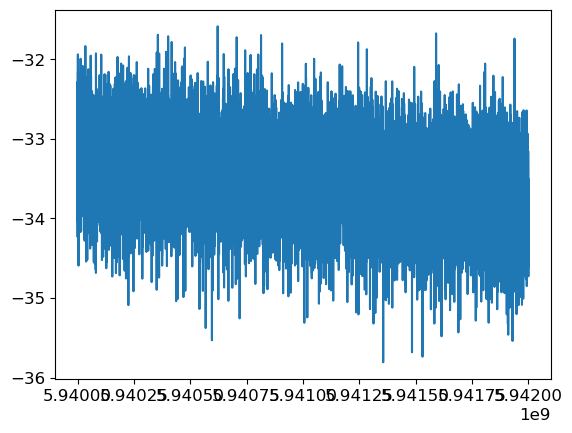

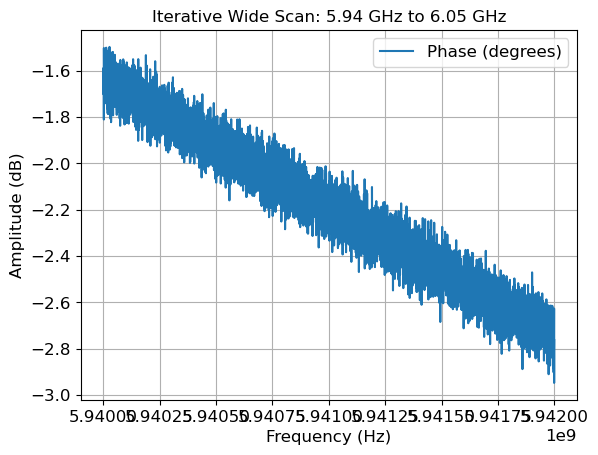

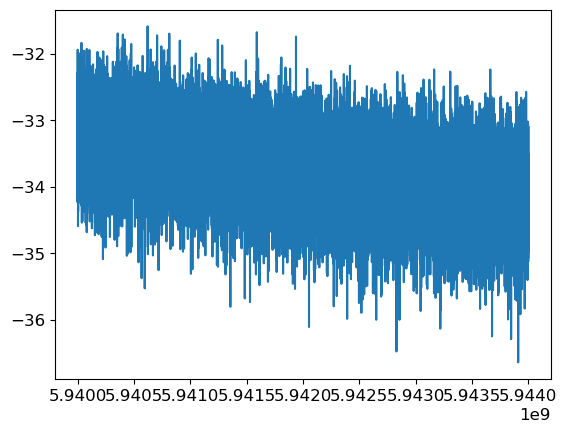

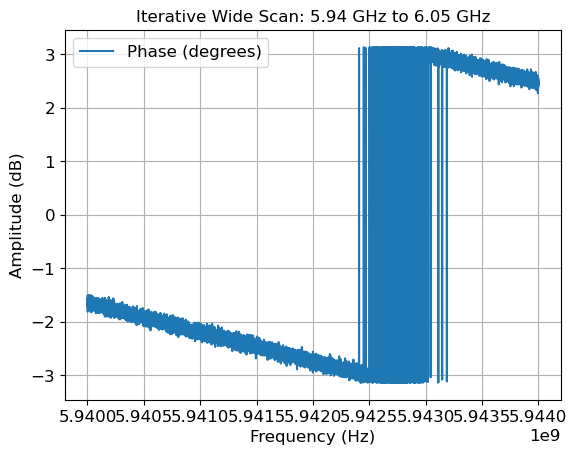

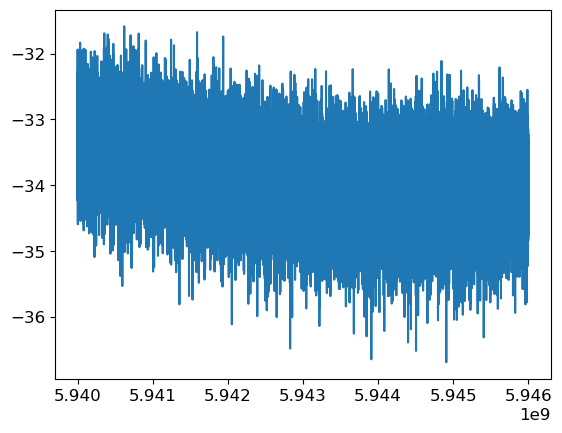

...

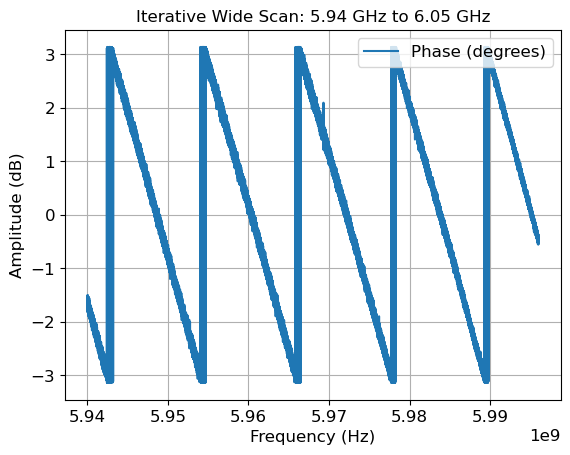

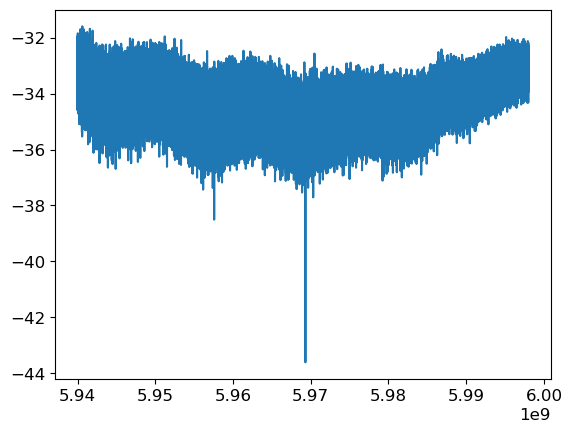

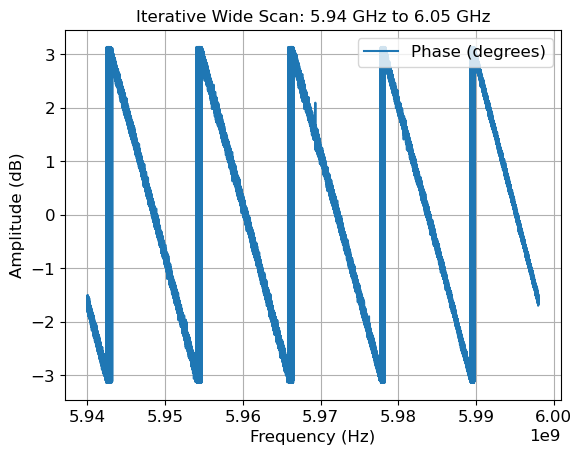

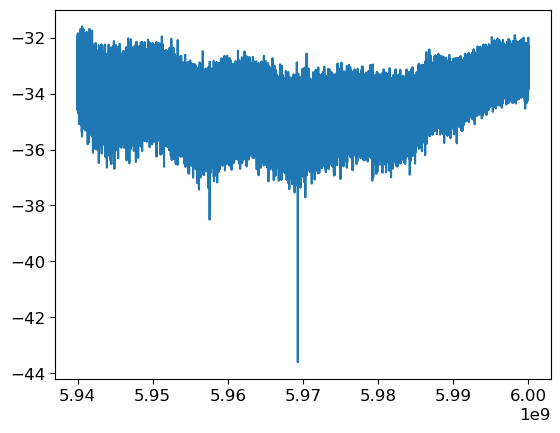

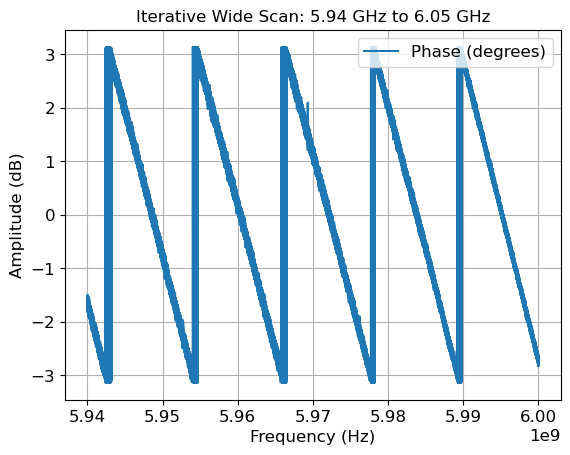

KeyboardInterrupt: 

In [31]:
# I want to go at span of 10 Mhz with 10001 points each and go across 5.8 Ghz to 6.5 Ghz
# every scan can only do 10001 points. can you do an iterative scan, where each iteration 
# you move forward the range and update the plot 
start_freq = 5.94e9
stop_freq = 6.05e9
span = 2e6
npoints = 10001
power = -30
avgs = 1
bandwidth = 1000

freq_centers = np.arange(start_freq + span/2, stop_freq, span)
all_freqs = []
all_amps = []
all_phases = []
expt_path = base_path

# %matplotlib notebook
import matplotlib.pyplot as plt

plt.ion()
for i, freq_center in enumerate(freq_centers):
    scan_def = {
        'freq_center': freq_center,
        'span': span,
        'bandwidth': bandwidth,
        'power': power,
        'npoints': npoints,
        'averages': avgs,
        'spar': 'S21'
    }
    file_name = f'iter_scan_{i}_{int(freq_center)}'
    data = vna_measurement.do_vna_scan(VNA, file_name, expt_path, scan_def, plot=False)
    all_freqs.append(data['freqs'])
    all_amps.append(data['amps'])
    all_phases.append(data['phases'])
    plt.clf()  # Clear the current figure
    plt.plot(np.concatenate(all_freqs), np.concatenate(all_amps), label='Amplitude (dB)')
    # add the second figure on phases
    plt.figure()
    plt.plot(np.concatenate(all_freqs), np.concatenate(all_phases), label='Phase (degrees)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude (dB)')
    plt.title(f'Iterative Wide Scan: {start_freq/1e9:.2f} GHz to {stop_freq/1e9:.2f} GHz')
    plt.grid(True)
    plt.legend()
    plt.show()
    # plt.pause(0.05)
plt.show()

# scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':bandwidth, 'power':power, 'npoints':10001, 'averages':avgs, 'spar': 'S21'}
# #file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
# file_name = 'wide_scan'

# data = vna_measurement.do_vna_scan(VNA, file_name, expt_path, scan_def, plot = True)

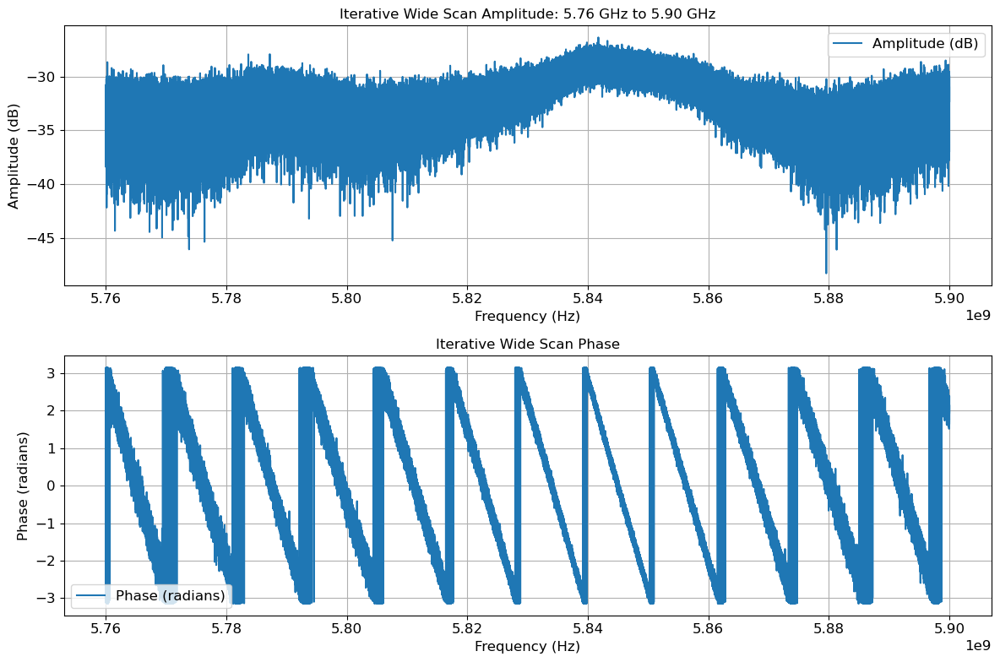

In [16]:
# make a large plot for amplitude and phase, and save it
plt.figure(figsize=(12, 8))
expt_path = base_path

plt.subplot(2, 1, 1)
plt.plot(np.concatenate(all_freqs), np.concatenate(all_amps), label='Amplitude (dB)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude (dB)')
plt.title(f'Iterative Wide Scan Amplitude: {start_freq/1e9:.2f} GHz to {stop_freq/1e9:.2f} GHz')
plt.grid(True)
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(np.concatenate(all_freqs), np.concatenate(all_phases), label='Phase (radians)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase (radians)')
plt.title('Iterative Wide Scan Phase')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.savefig(f'{expt_path}/iterative_wide_scan.png')

In [17]:
expt_path

'G:\\Shared drives\\SLab\\Multimode\\LinearMultimode\\measurements\\vna_meas_250910'

In [11]:
expt_path

'G:\\Shared drives\\SLab\\Multimode\\LinearMultimode\\measurements\\ena_meas_250910\\S2Ps'

In [184]:
plt.show()

In [181]:
all_freqs

[array([5.70e+09, 5.70e+09, 5.70e+09, ..., 5.71e+09, 5.71e+09, 5.71e+09]),
 array([5.71e+09, 5.71e+09, 5.71e+09, ..., 5.72e+09, 5.72e+09, 5.72e+09]),
 array([5.72e+09, 5.72e+09, 5.72e+09, ..., 5.73e+09, 5.73e+09, 5.73e+09])]

# Wide Sweep

In [ ]:
mode_freqs = [4976206800, 5138249900, 5300958000, 5622688300 , 5786404600, 5969312200, 6130556458.122475, 
              6317752481.77095,6512205950.979016,6708674069.282833]

In [11]:
#%matplotlib widget
expt_path = base_path

span= 1e9
power = -30
avgs = 1
freq_center =    4.808e9# 4.76723
bandwidth=10000


scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':bandwidth, 'power':power, 'npoints':10001, 'averages':avgs, 'spar': 'S21'}
#file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
file_name = 'wide_scan'

data = vna_measurement.do_vna_scan(VNA, file_name, expt_path, scan_def, plot = True)



Cannot get data
shape of val: (0,)


new freq_center: 6708674000.0


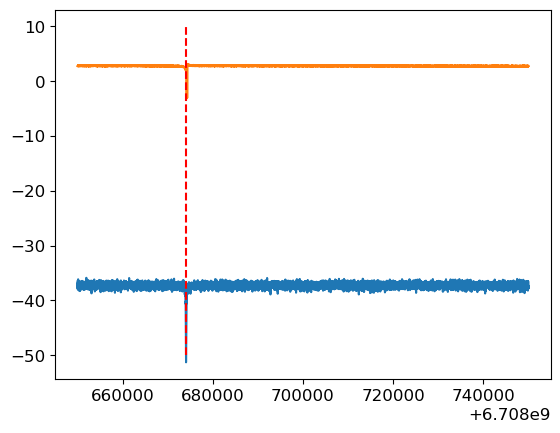

In [104]:

# Plot 
adjust = 26000
plt.plot(data['freqs'], data['amps'], label = 'amps')
plt.plot(data['freqs'], data['phases'], label = 'phases')
plt.vlines(x=freq_center - adjust, ymin = -50, ymax = 10,color='r', linestyle='--', label='Center Frequency')
print('new freq_center:', freq_center - adjust)

In [124]:
data

{'series': '20250912_114355',
 'amps': array([-32.4795, -31.9889, -32.9956, ..., -33.1469, -32.9219, -32.4734]),
 'phases': array([0.6357, 0.5943, 0.5674, ..., 0.607 , 0.5943, 0.6162]),
 'freqs': array([5.7864e+09, 5.7864e+09, 5.7864e+09, ..., 5.7864e+09, 5.7864e+09,
        5.7864e+09]),
 'vna_power': -30,
 'power_at_device': -30,
 'bandwidth': 1000,
 'averages': 1,
 'npoints': 10001}

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=21813412.407502677) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=23055614.57602166) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=60152870.54932643) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=62253938.56206044) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=6708674064.6929) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\env

>Error when trying to write parameters on plot
>cannot convert float infinity to integer
Q_i: (million ) 35.41676244962085


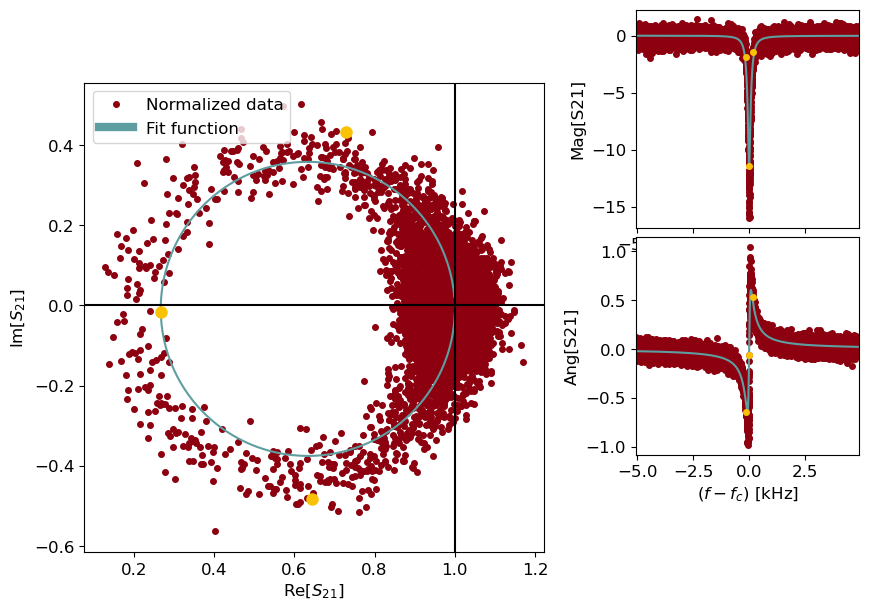

In [ ]:
from scresonators.fit_resonator.ana_resonator import ResonatorFitter
output = ResonatorFitter.fit_resonator(
        data, 'Test', os.getcwd(), plot=True, fix_freq=False, fit_type='DCM REFLECTION'
    )

# get q_i 
Q,Qc,freq,phase = output[0]
# Use 1/Q = 1/Qc + 1/Qi to get Q_i
Qi = 1/(1/Q - 1/Qc)
print('Q_i: (million )', Qi*1e-6)

In [ ]:
jjjj datas[0]['data']

In [107]:
freq

6708674069.282833

In [55]:
output

([27847047.44588646, 68660809.72626701, 5969312242.269374, 0.1511544058976987],
 [inf, inf, inf, inf, 3.141592653589793, 1.8323392868041992],
 0.0028486635976084796,
 [26358546.36697254, 64762986.569834955, 5969312234.6, 0.12766156713677246])

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=16221137.655673848) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=16274272.679769954) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=19855231.07594506) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=19902693.67293254) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=4976206938.435655) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\

>Error when trying to write parameters on plot
>cannot convert float infinity to integer


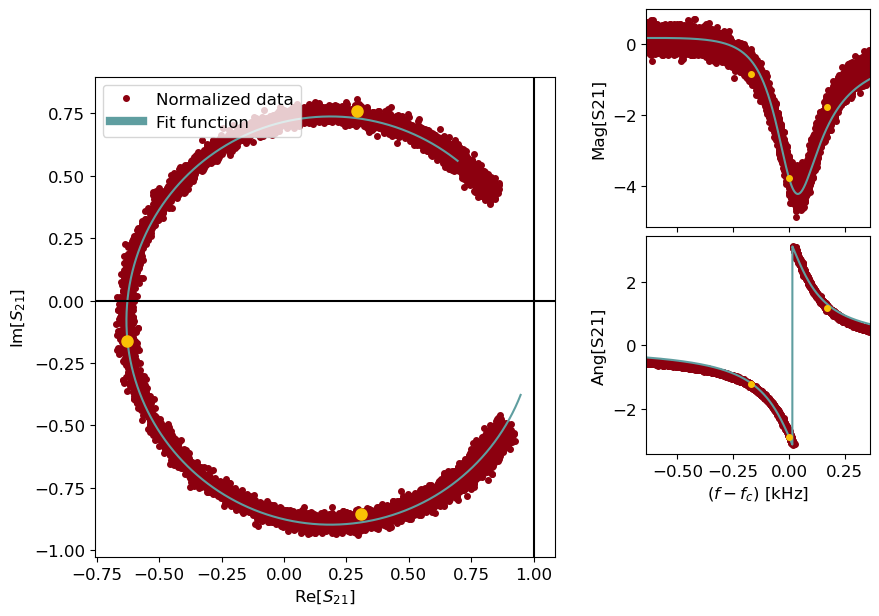

In [129]:
output = ResonatorFitter.fit_resonator(
        all_datas[0]['data'], 'Test', os.getcwd(), plot=True, fix_freq=False, fit_type='DCM REFLECTION'
    )

# Fine Sweep

Calculated line delay: -0.0019809089345643087


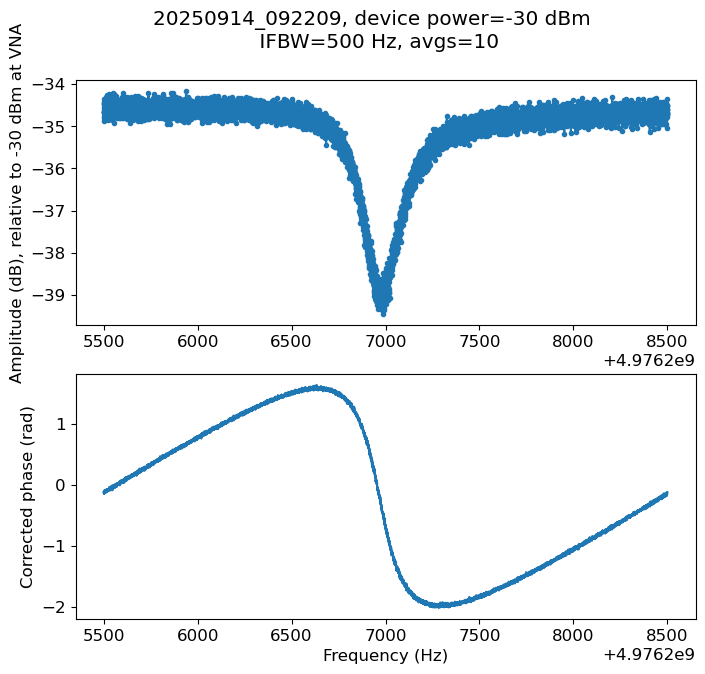

Calculated line delay: -0.007815166347730372


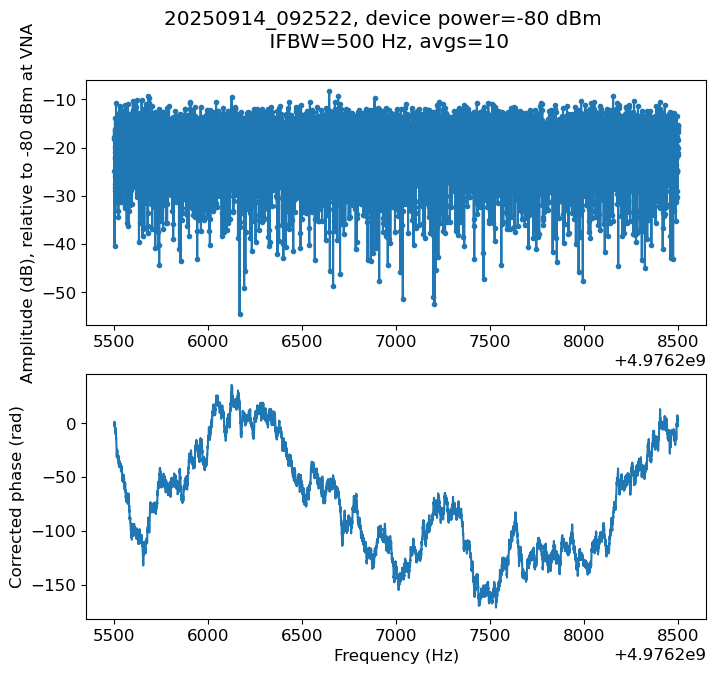

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=105189.22623148485) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=80216.51979973365) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][2][1])


Calculated line delay: 0.02082393398220565


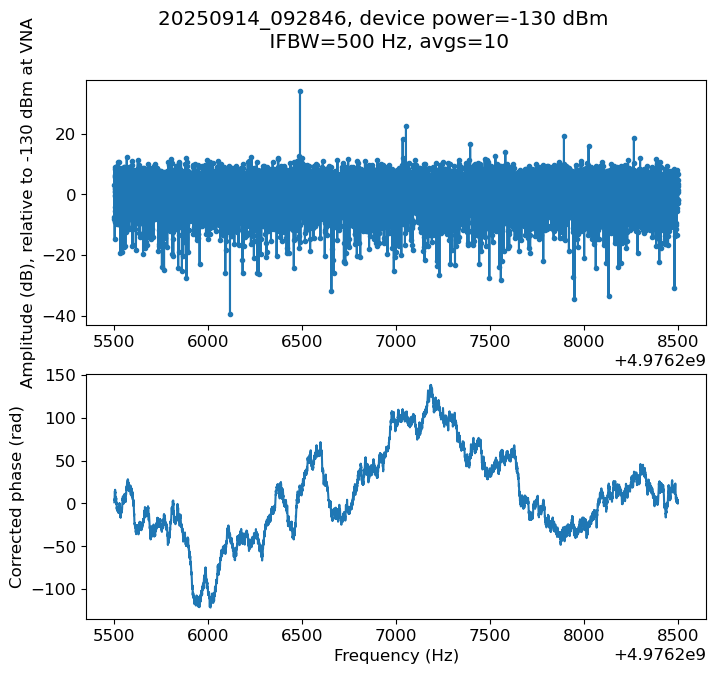

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=38636.819669973884) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -0.0006212643962542624


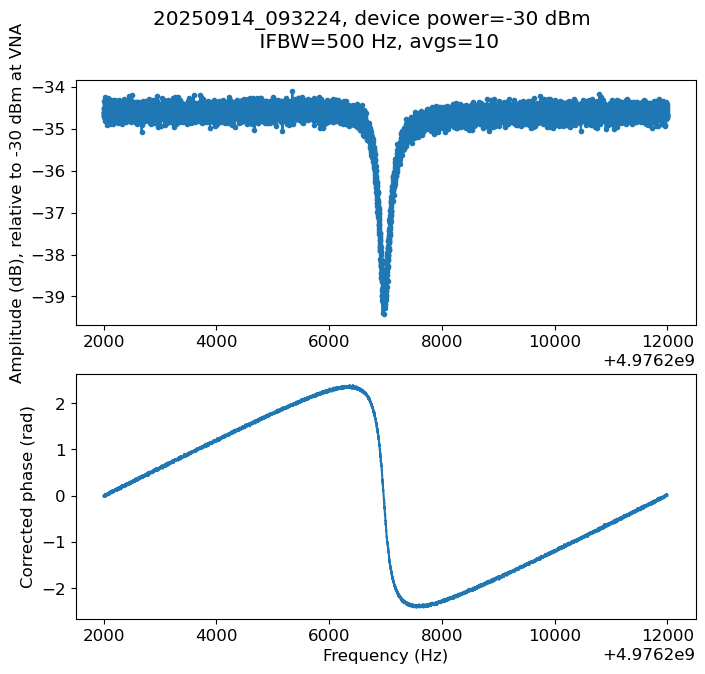

Calculated line delay: -0.019049294582368093


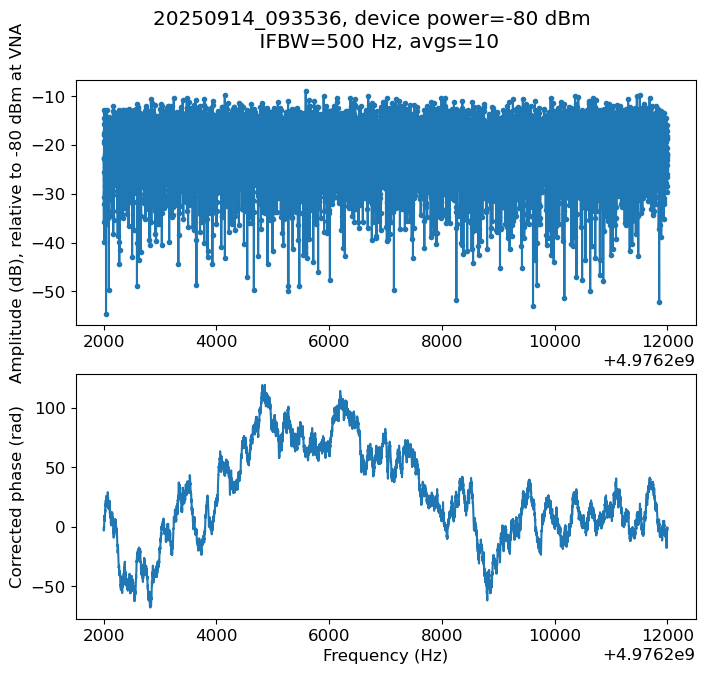

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=40986.67751515903) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=22227.01350624574) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 0.019056822793669416


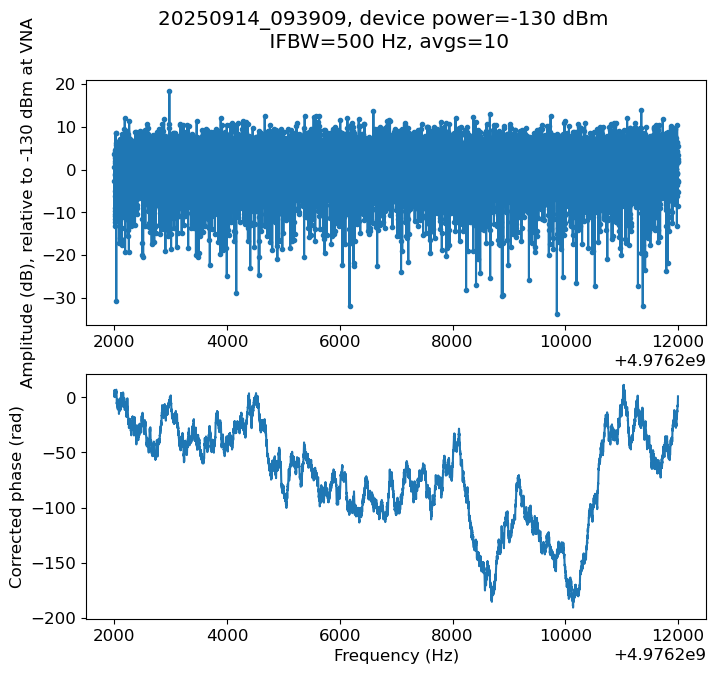

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=53786.76308064105) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=20448.57439429704) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -0.0019996917419817075


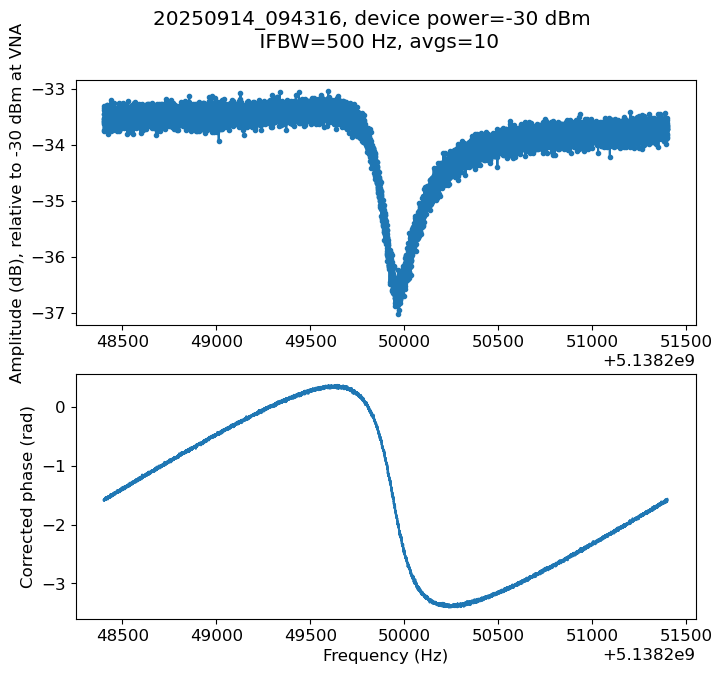

Calculated line delay: 0.0848971456349071


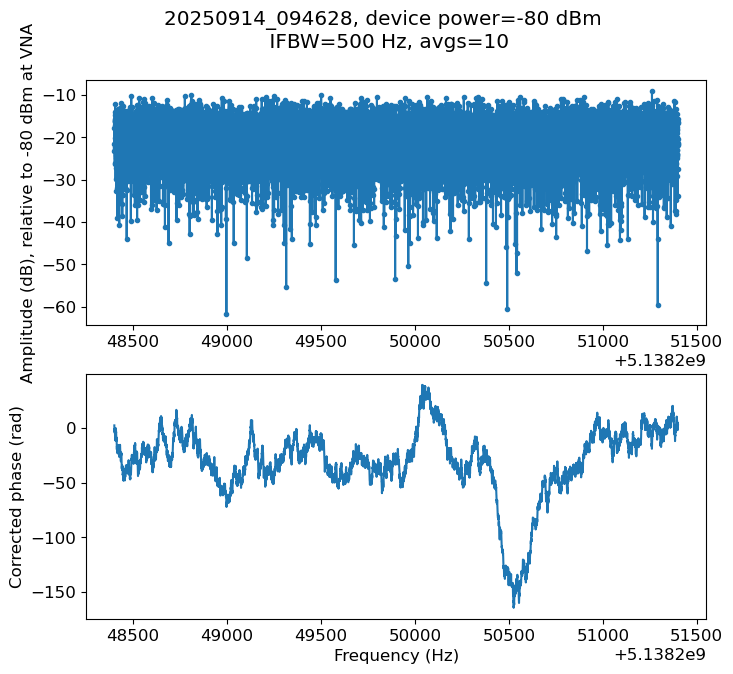

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=75825.67124567392) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=27729.514203067993) = 0.7931044790682711 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=83188.54260920399) = 0.4403110723392506 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])
C:\_Lib\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) /

Calculated line delay: 0.027044158384861124


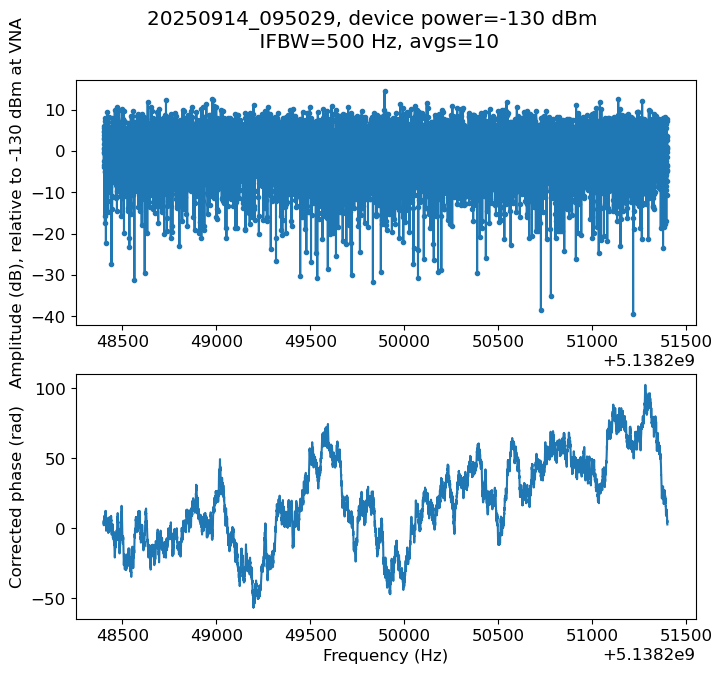

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=511806.8590242961) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=198117.25928221366) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -0.0006211930342268425


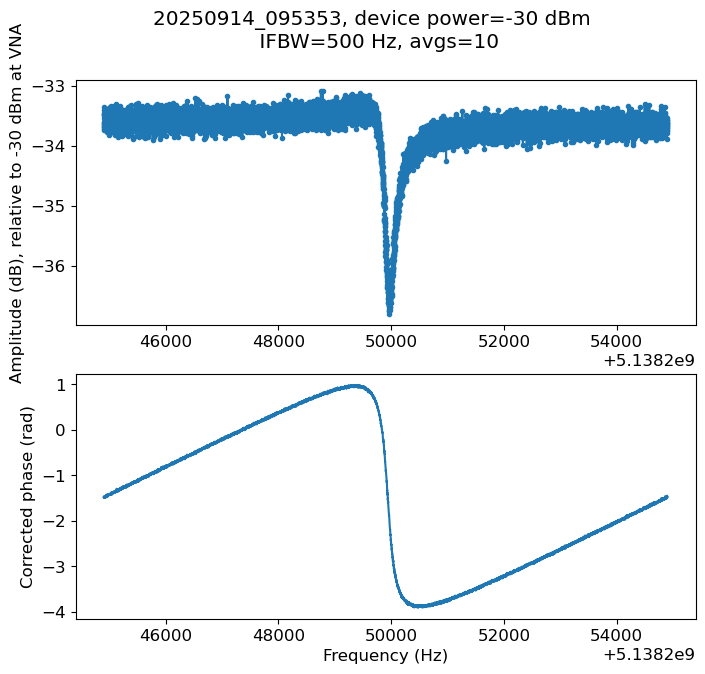

Calculated line delay: -0.017289287890388947


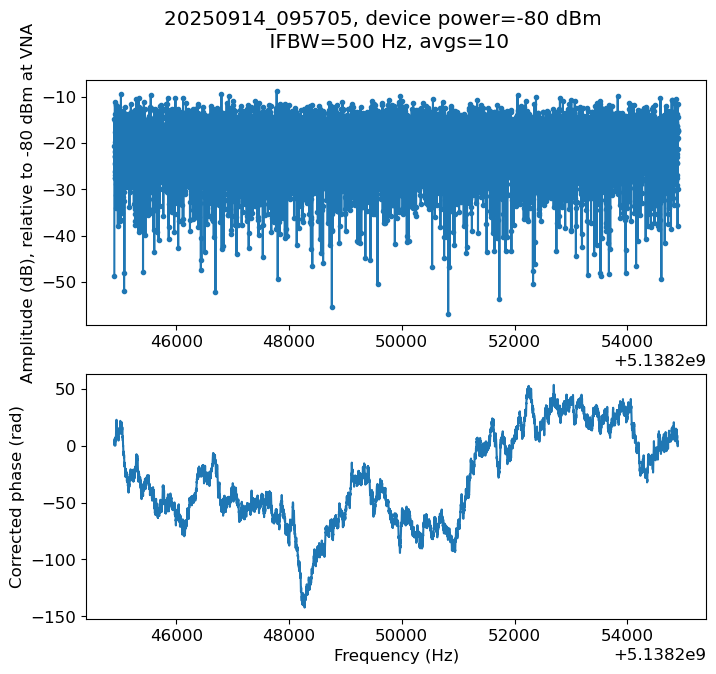

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=2335091.899226784) = 0.01048817889798564 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=9826500.053954218) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=39721.91388215879) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=-1.0 < 1e-05 at iteration 8 and prob(Qc=103277.03076525877) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1014: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit

Calculated line delay: 0.006338667239196651


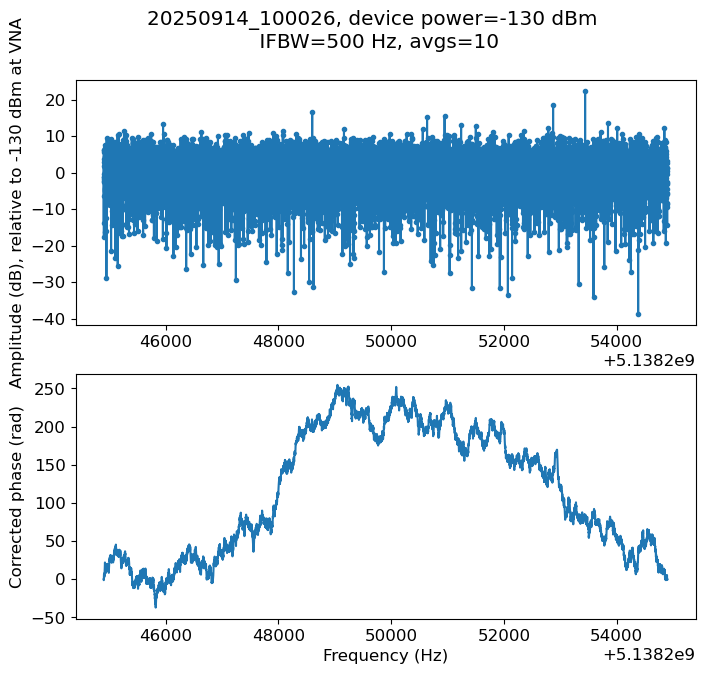

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=220348.28241628152) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=85636.37993928297) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 1.547465433191657e-05


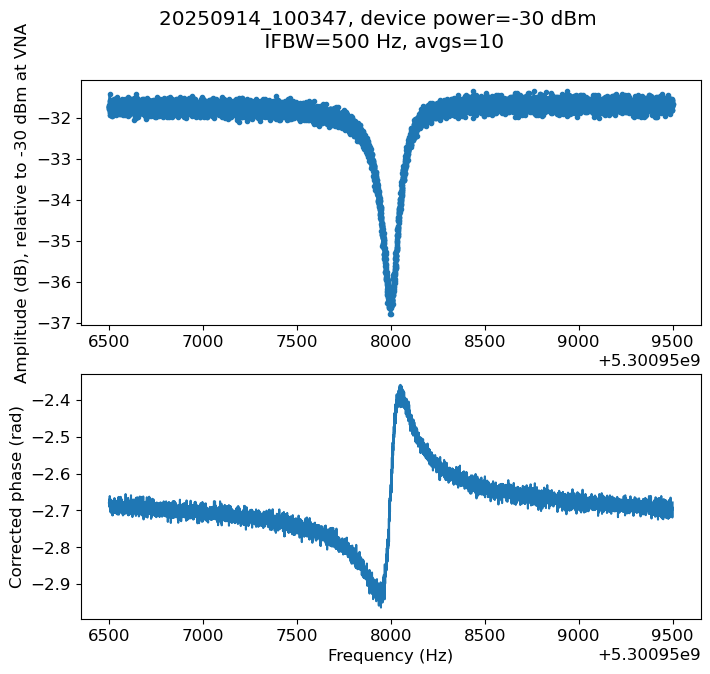

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=171314074.76298457) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=172346875.62722164) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=-0.12656353947101184) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])
C:\_Lib\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][2][1])


Calculated line delay: 0.0138502093980965


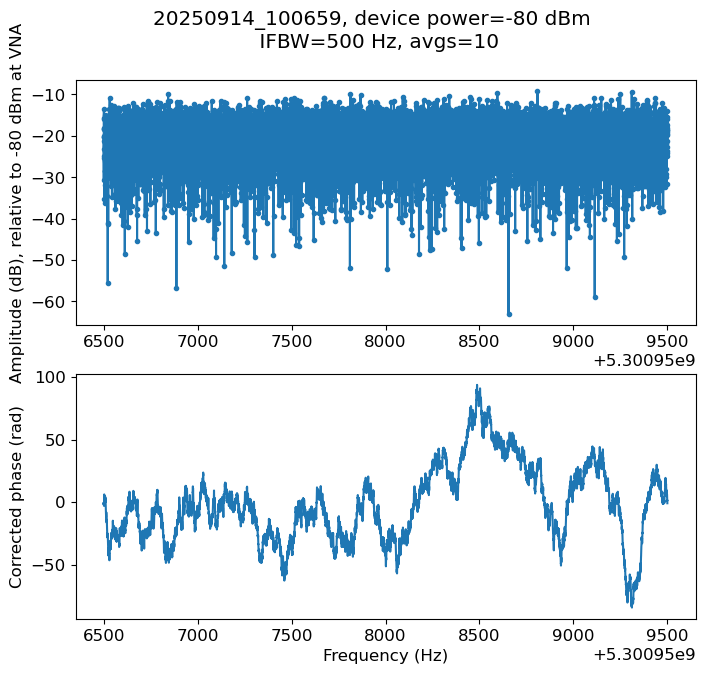

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=353847.0883486575) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=319197.4963224564) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5300941807.305365) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=1.329861964546244) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.r

Calculated line delay: -0.06858979043370657


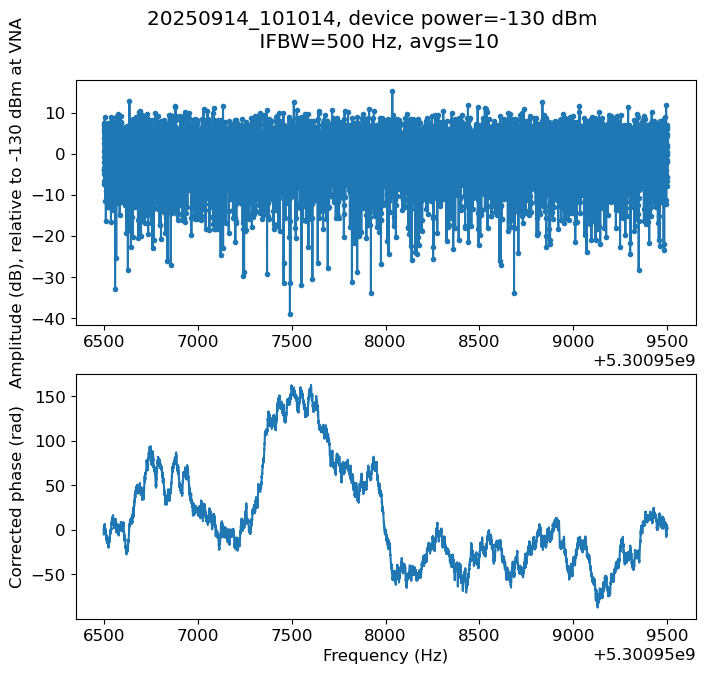

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=222826.2928195472) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -2.8859214724439754e-06


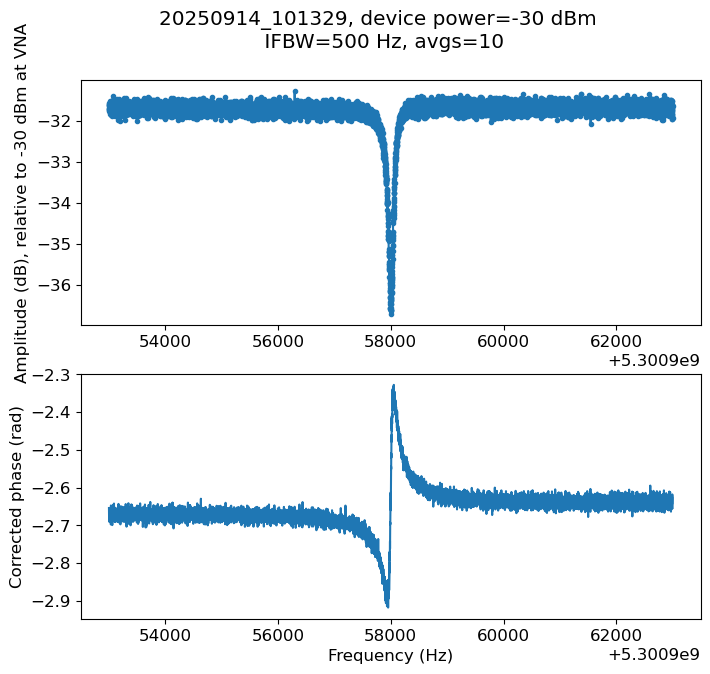

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=29361093.275978632) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=34781664.36008328) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=160152473.1159839) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=173438352.41746765) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5300957981.584603) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\

Calculated line delay: 0.010129207077521487


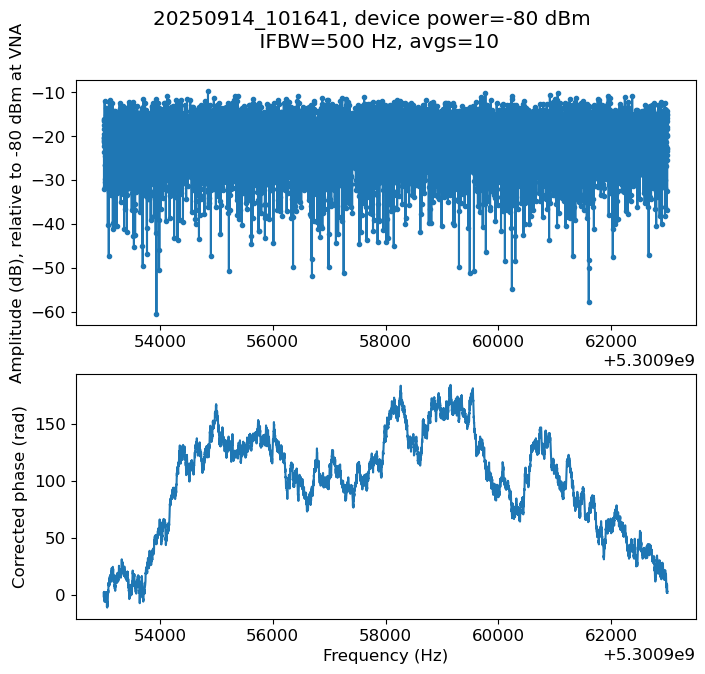

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=371638.995963426) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=141996.71809956557) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -0.024747486610314343


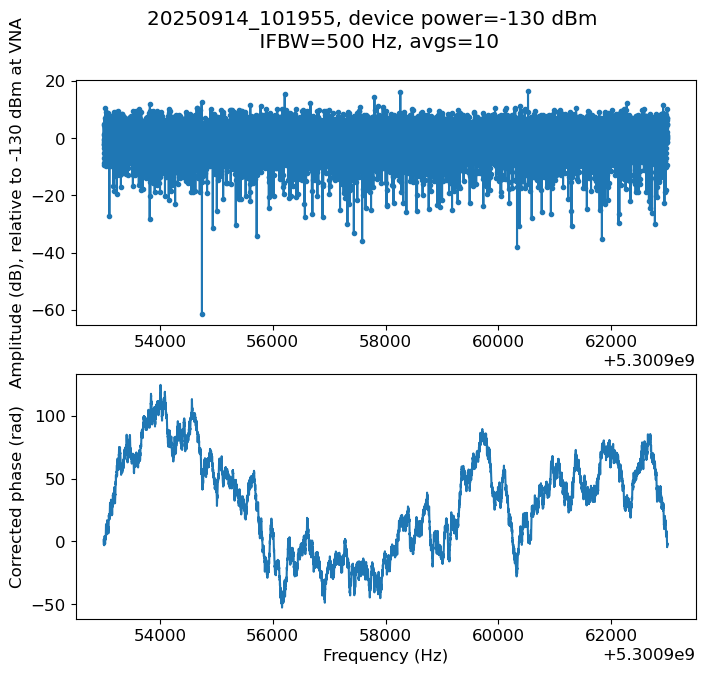

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=3208.0063781591475) = 0.7077199597551255 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=21386.70918772765) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=5878.250699364925) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=17634.752098094774) = 0.7779325253385632 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=-0.0045905082180915935 < 1e-05 at iteration 7 and prob(phi=0.5777604465911022) = 0.8012417092909612 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1014: Run

Calculated line delay: 1.5253266583227543e-05


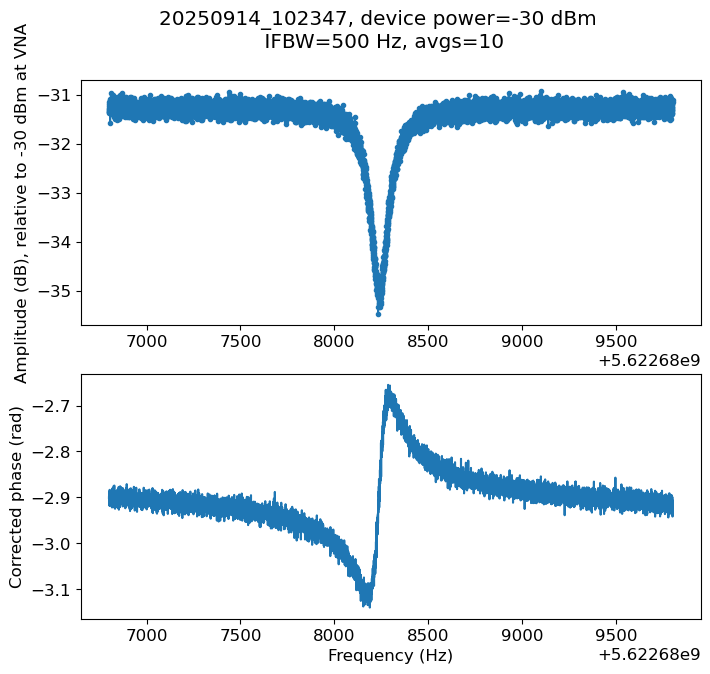

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=40011243.093775146) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=41216428.57013629) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=222354344.03494596) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=224348612.8085869) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5622688239.902258) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\

Calculated line delay: -0.009251614128151217


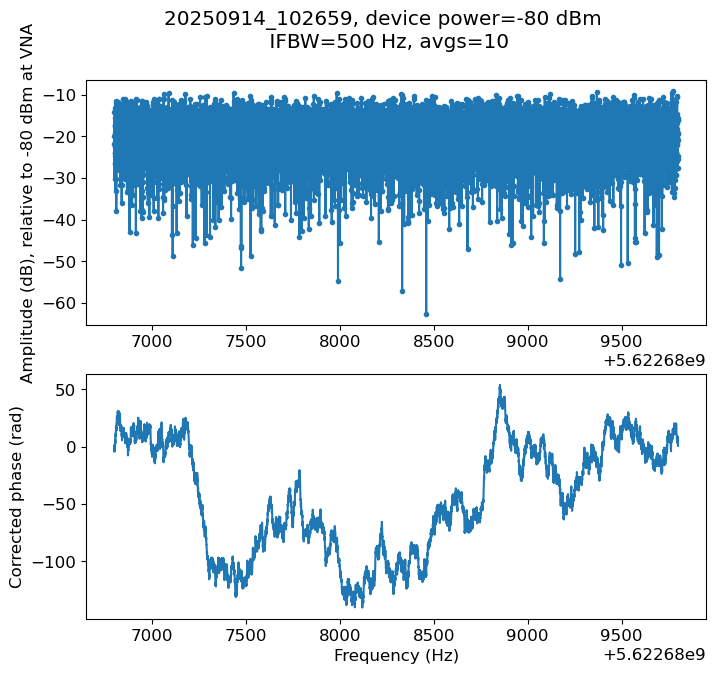

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=2017205.4662138713) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=710389.2589082087) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 0.10754334586836742


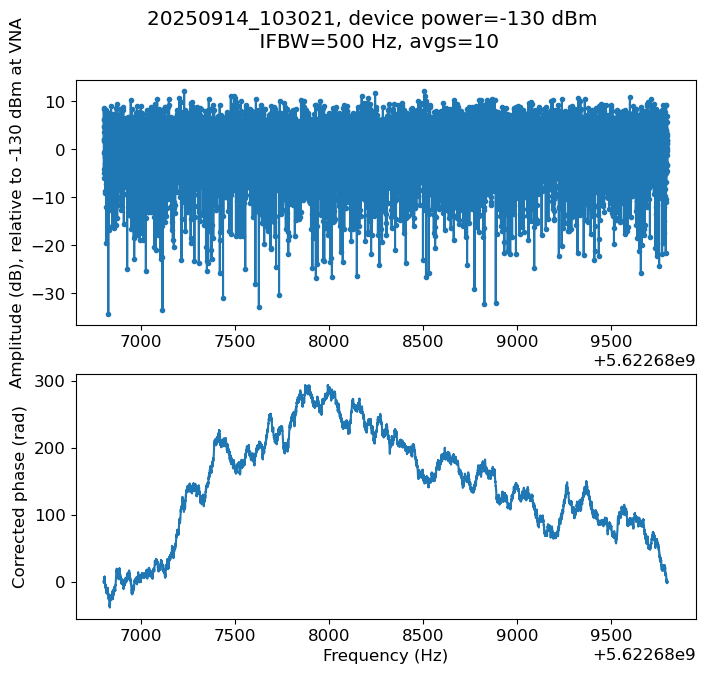

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=15150.503166202105) = 0.25034560627536745 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=66361.34803736053) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=22852.726638468022) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=-0.411112902279412 < 1e-05 at iteration 5 and prob(phi=-1.1102230246251565e-16) = 0.255345119330898 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar 

Calculated line delay: 1.508393552520371e-06


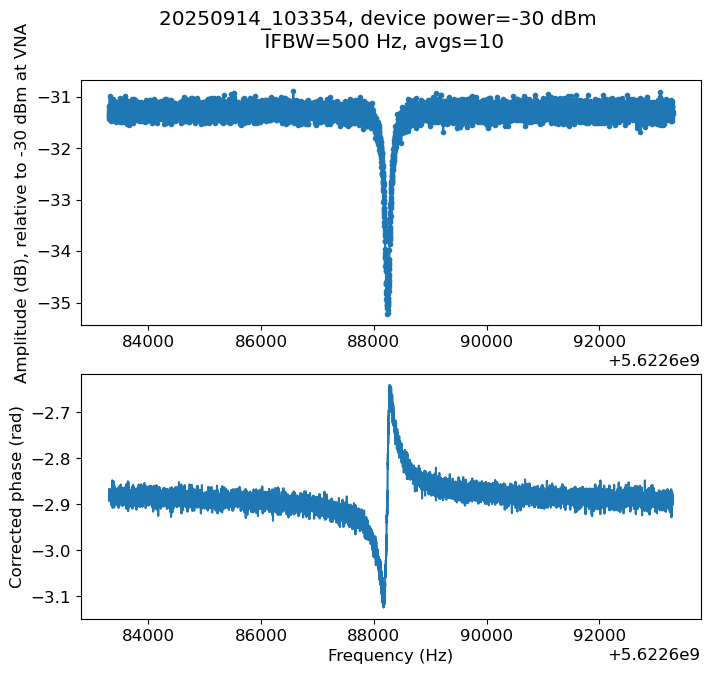

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=35681698.82254732) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=38139824.836623505) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=213832947.5382336) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=219006047.13692054) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5622688236.310446) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\

Calculated line delay: -0.006609621053397143


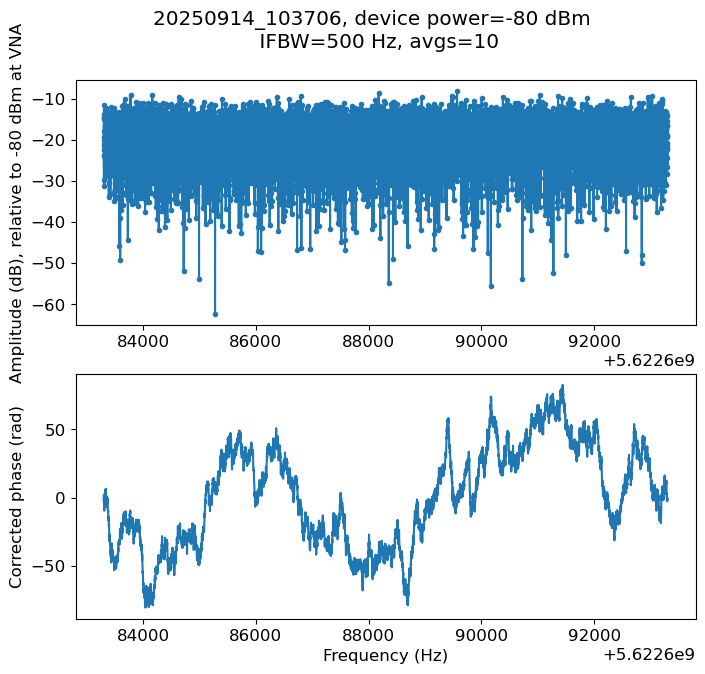

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=3222983.0542069534) = 0.07233599938797337 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=21486553.694713023) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=158962.33770544885) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1014: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][2][1])


Calculated line delay: -0.011787497937115482


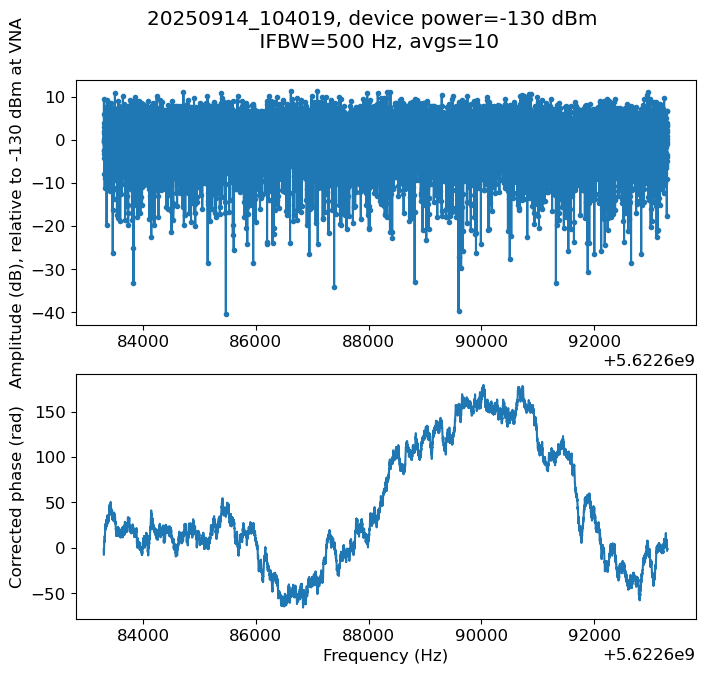

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=242107.48400176162) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=95099.2486182739) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 2.0664589604333612e-05


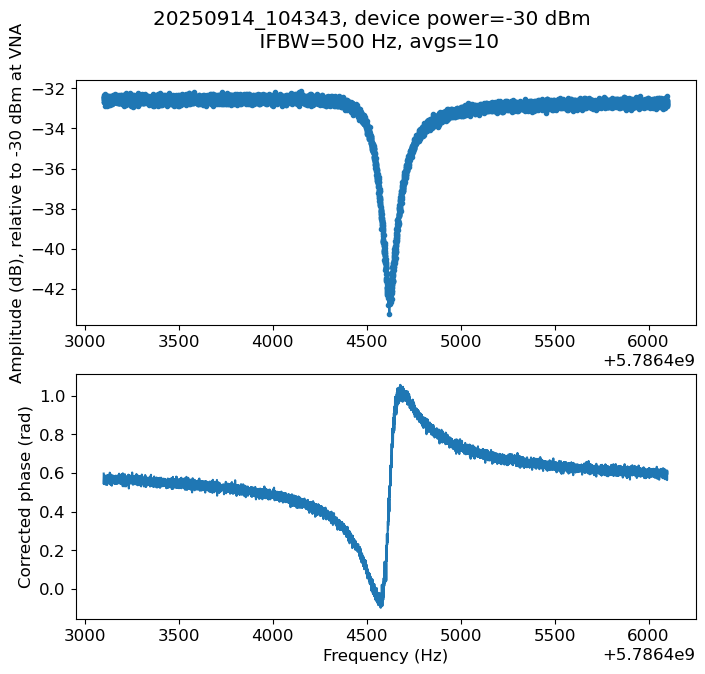

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=29307374.695300452) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=29621233.159006633) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=86405483.2019738) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=86795378.46922705) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5786404603.287643) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\e

Calculated line delay: -0.029589919781573302


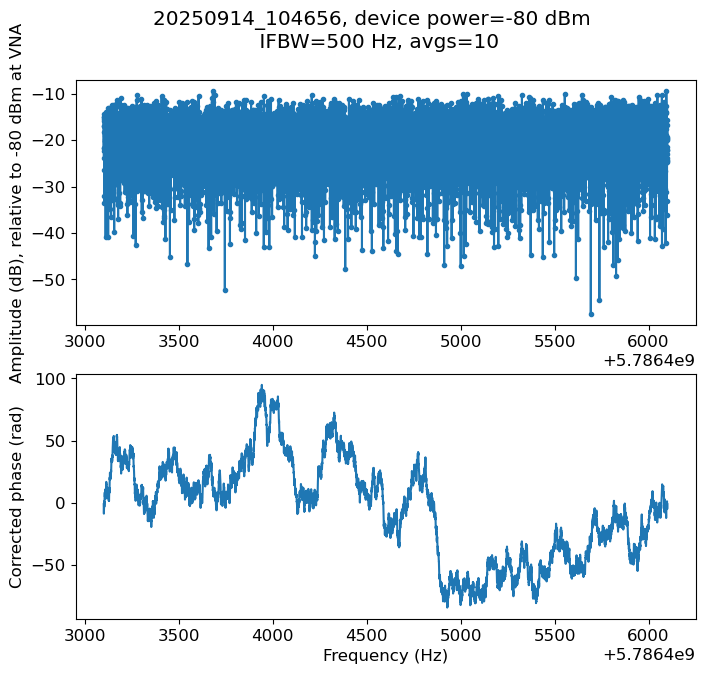

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=68633.33672651574) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=21956.164664502736) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=65868.49399350821) = 0.9427740636844834 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=-0.005485813774601218 < 1e-05 at iteration 4 and prob(phi=0.2770191823099058) = 0.48044892137819645 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 /

Calculated line delay: 0.02902940361601728


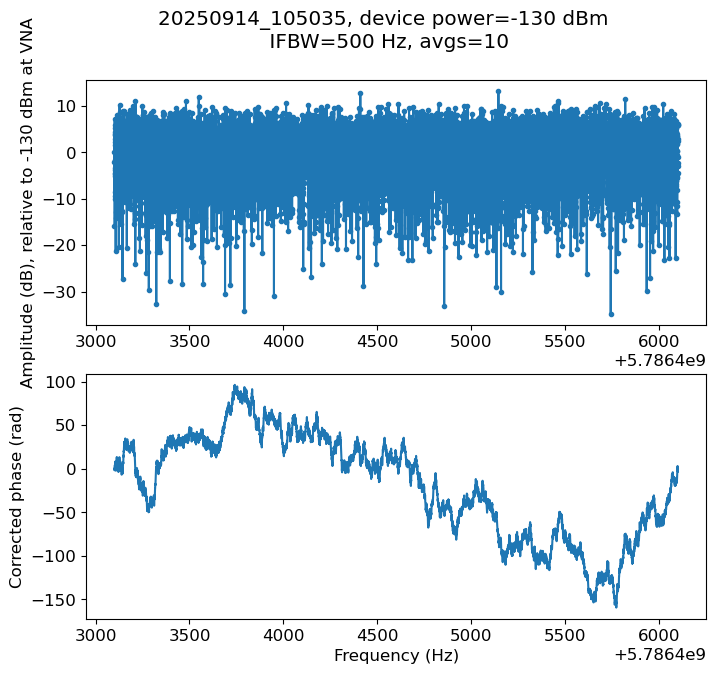

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=191021.43226774945) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][2][1])


Calculated line delay: -9.688113627936202e-07


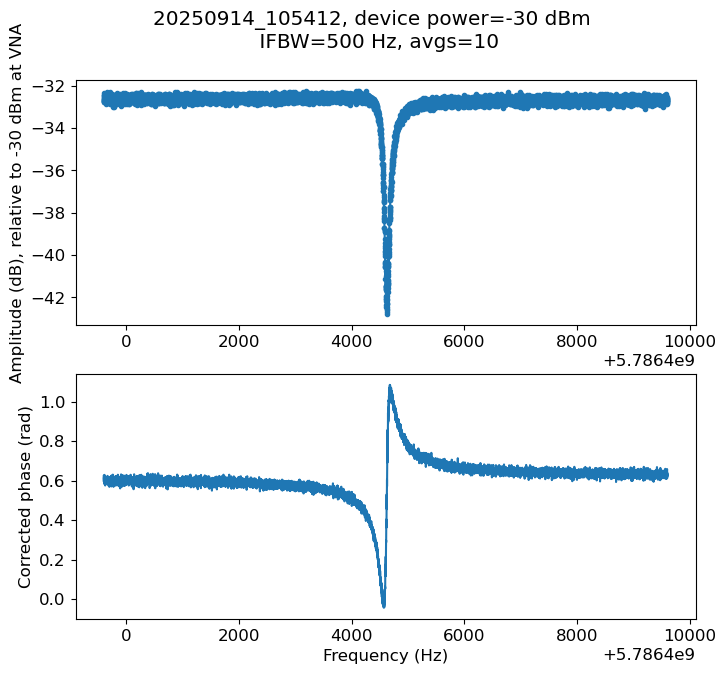

Calculated line delay: -0.0026269018441220236


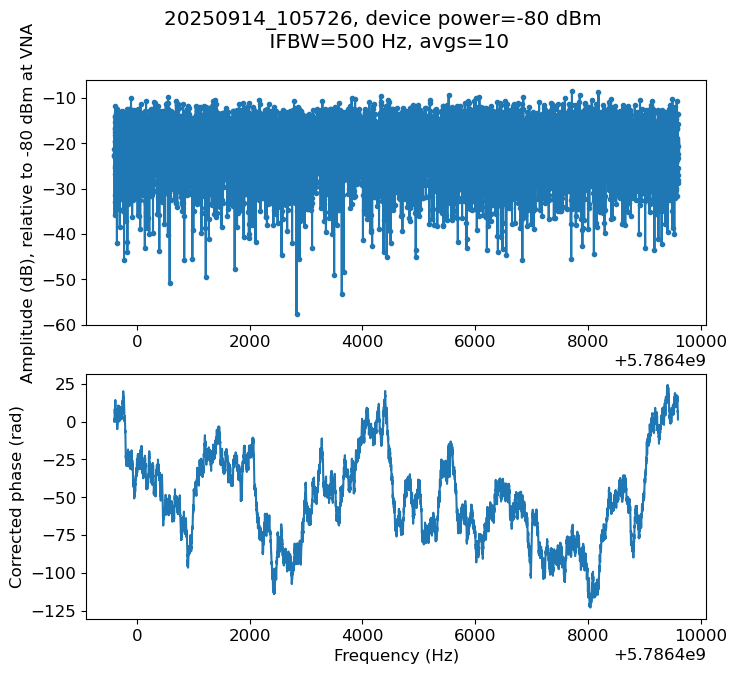

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=20772.646589378823) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=13062.306445739712) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=39186.91933721914) = 0.5959388039687074 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5786283630.772388) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5786501851.392572) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lm

Calculated line delay: 0.0018937750141552875


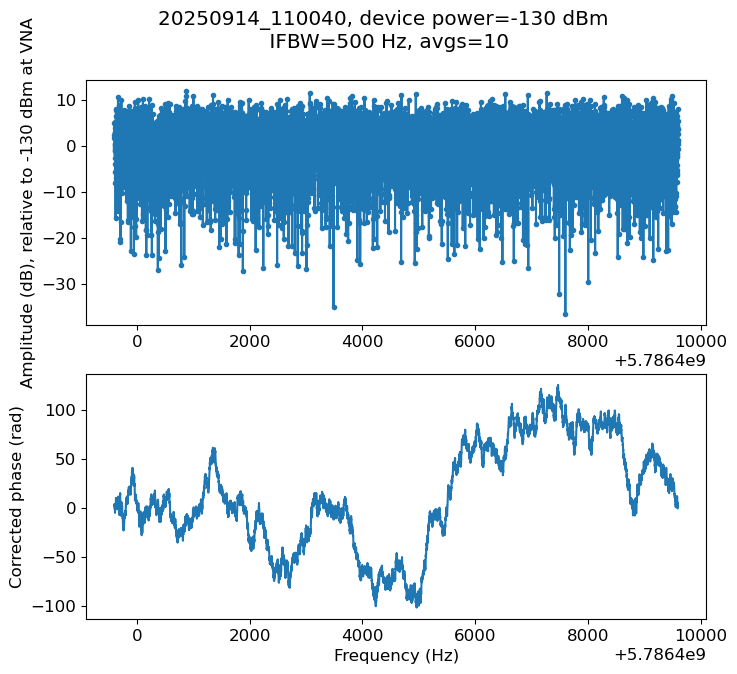

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=104951.75674111562) = 0.9445659997664051 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=40820.91916575992) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5786426190.501059) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=0.14536034435479797) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=0.21804051653219694) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: Ru

Calculated line delay: 2.8902708822083116e-05


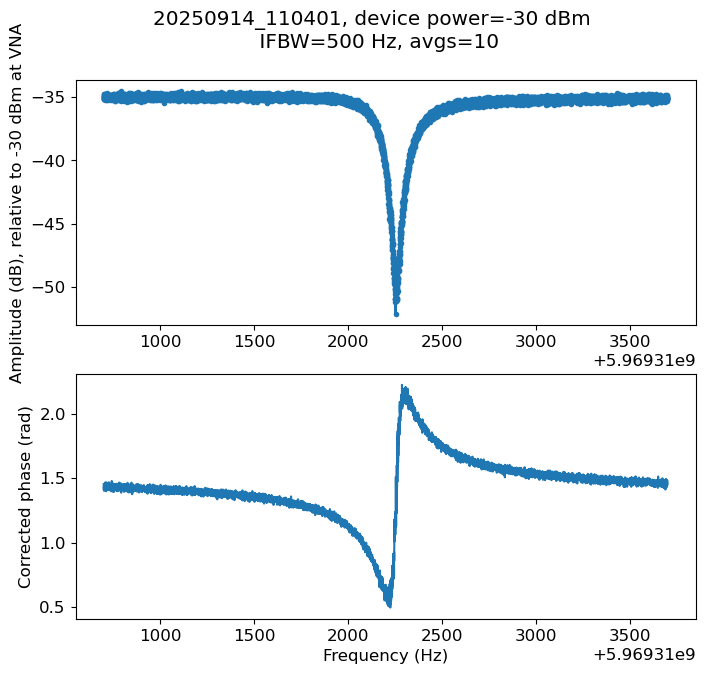

Calculated line delay: -0.036843208716159974


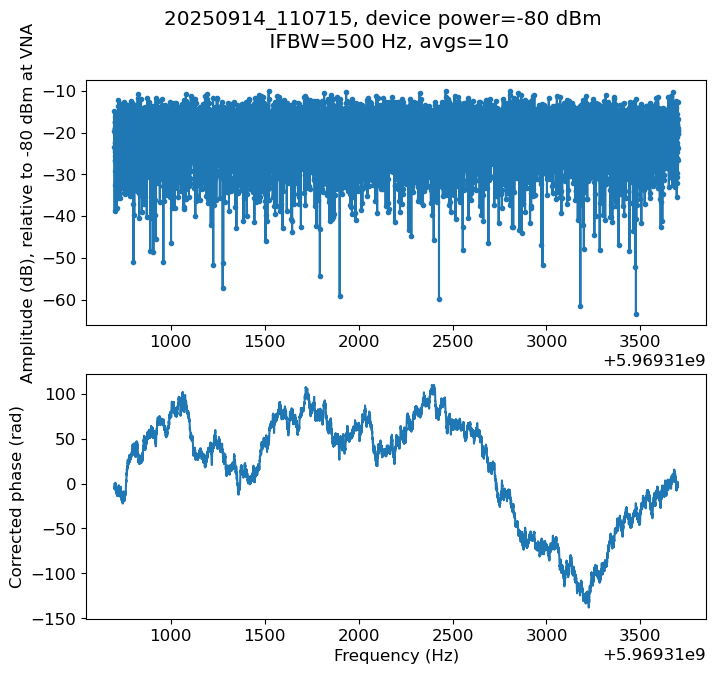

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=400863.0537449138) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=153876.72140195454) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 0.039337341503403164


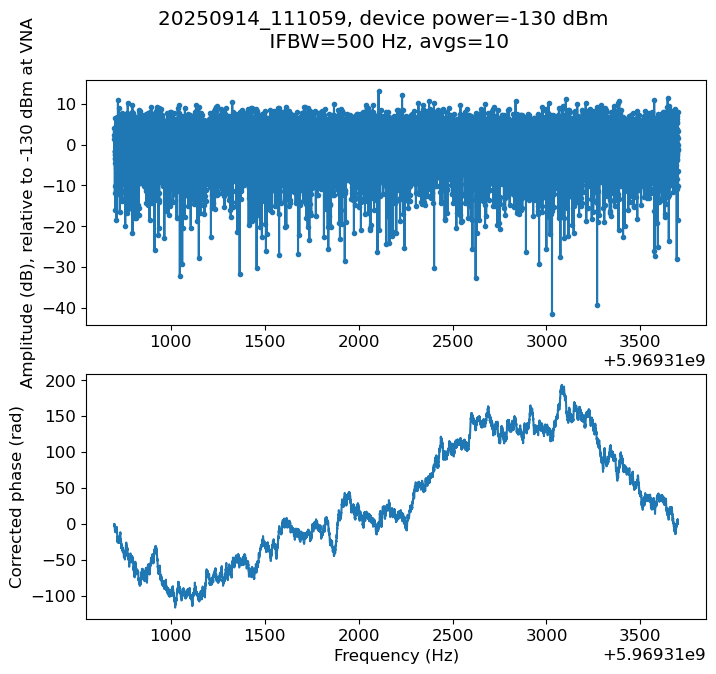

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=379773.3263319427) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=151051.95205244393) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 3.973340639502098e-06


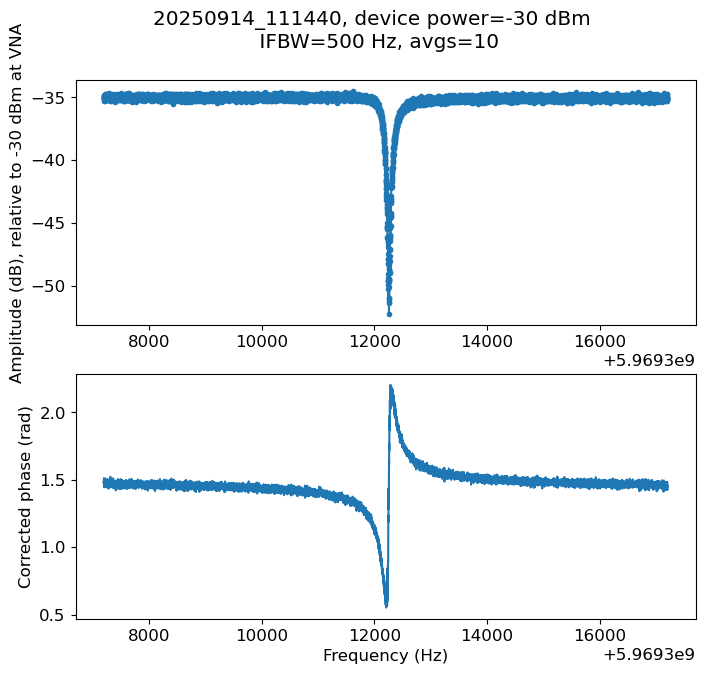

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=24871136.434400264) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=26806463.10125694) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=65579081.9950478) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=68452297.06642814) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5969312219.661576) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\en

Calculated line delay: -0.017237349442530657


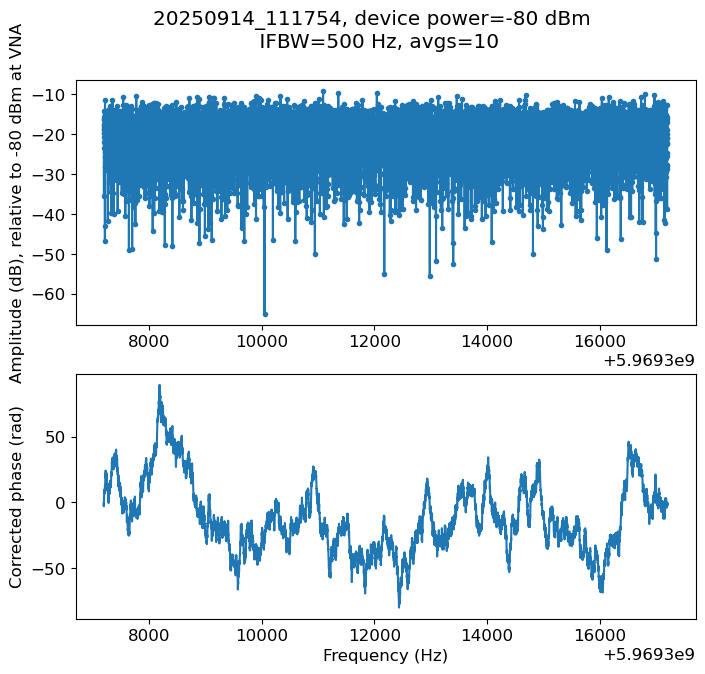

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=22160.09148231555) = 0.23606707249574685 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=8097.062046732682) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=24291.186140198046) = 0.8590049697624963 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=0.30639671476491337) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1

Calculated line delay: 0.01203965399083523


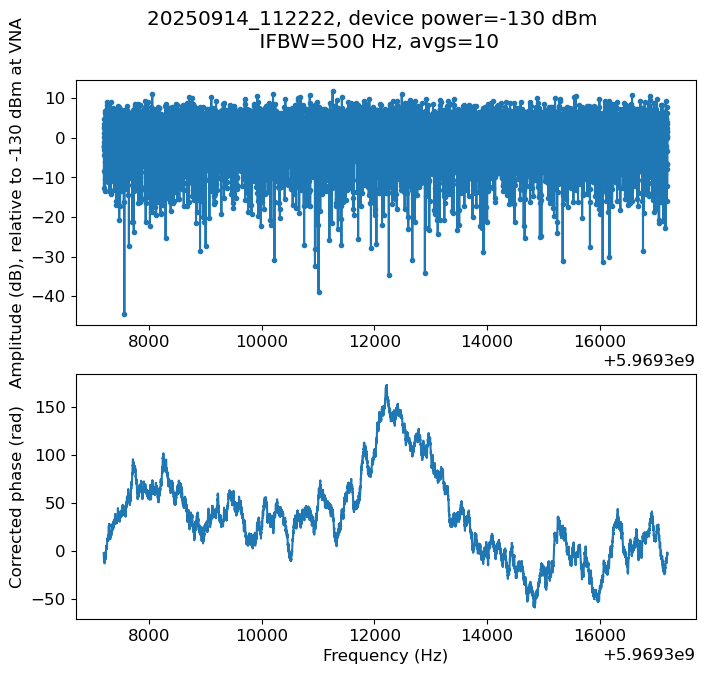

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=47566.50536429941) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=18420.76489786952) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -0.0020448270502779176


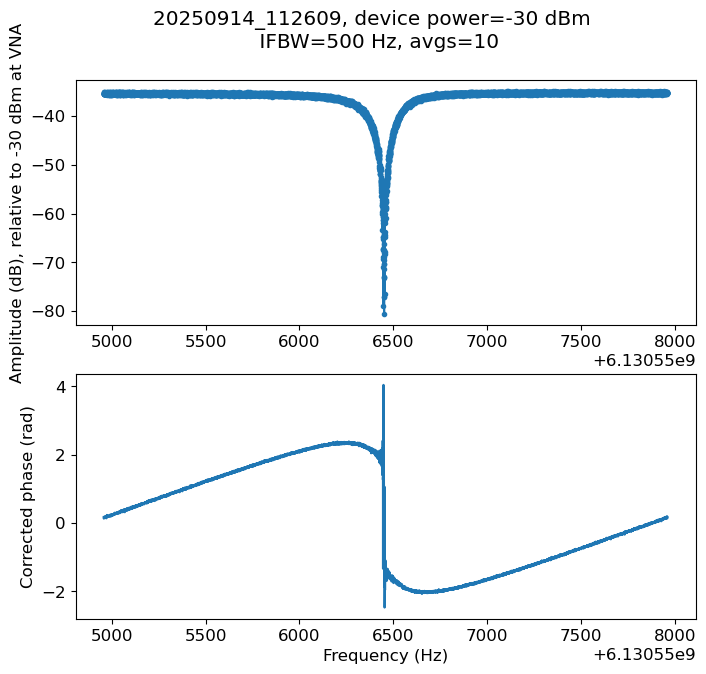

Calculated line delay: -0.03695343439654018


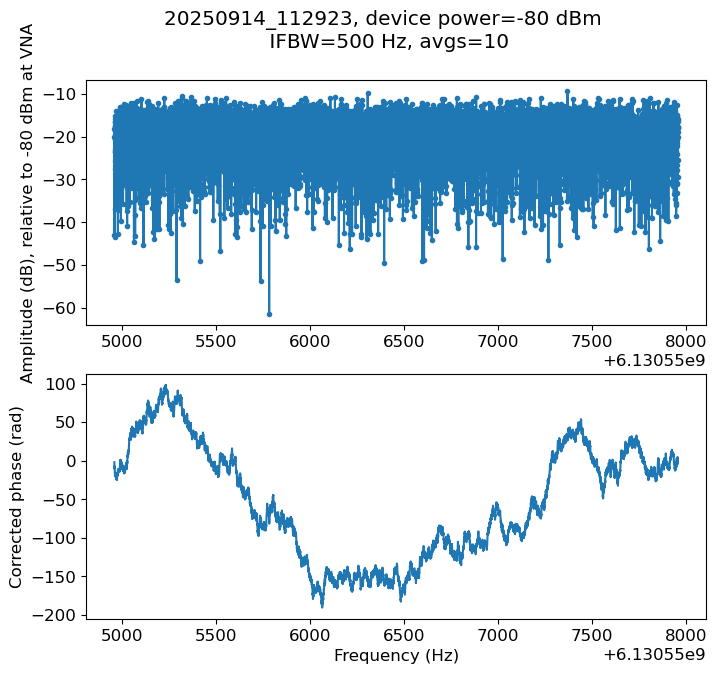

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=462992.5771212372) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -0.011798471104643344


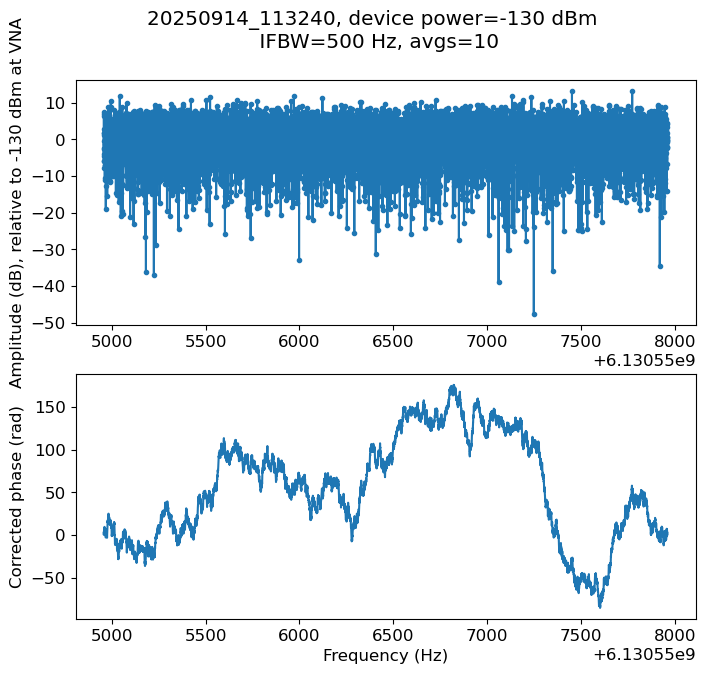

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=1237957.849983282) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=473917.0327777399) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -0.0006263923590590465


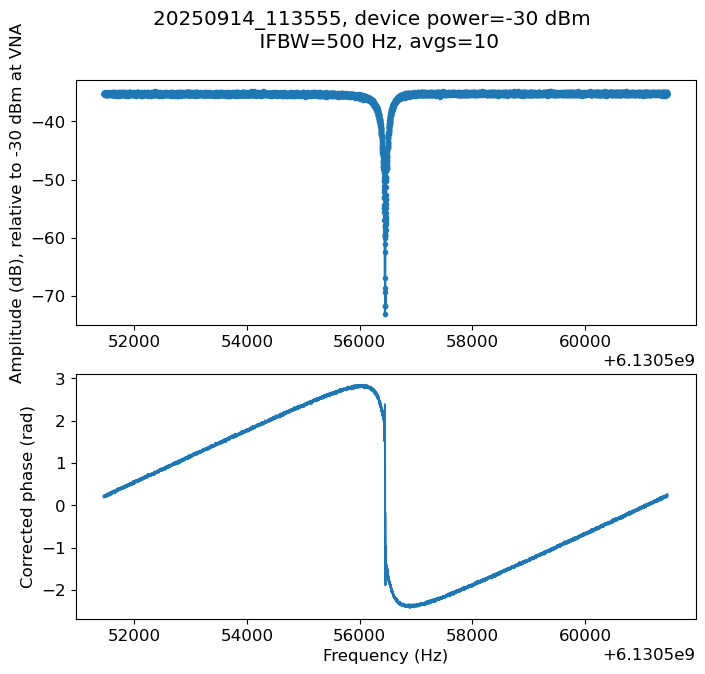

Calculated line delay: 0.01630712247066482


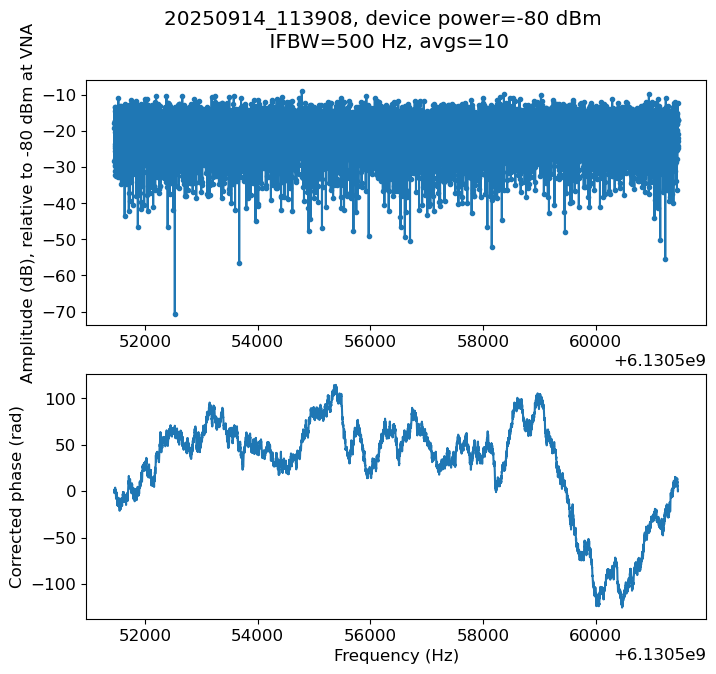

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=141831.33387679377) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][2][1])


Calculated line delay: -0.003769331023806312


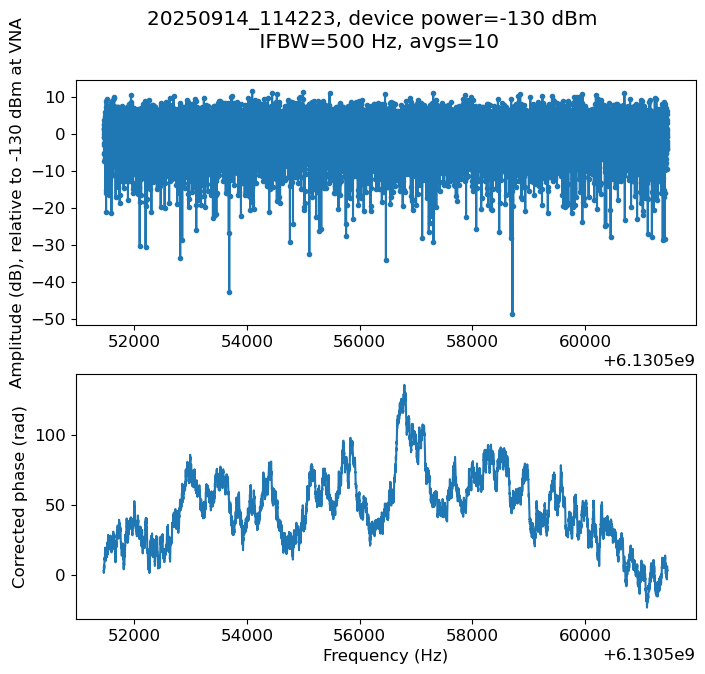

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=16538.964502479794) = 0.6416204944929231 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=6324.140260323895) = 0.7821908183051185 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=18972.420780971683) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])
C:\_Lib\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) 

Calculated line delay: -0.0020096311468194112


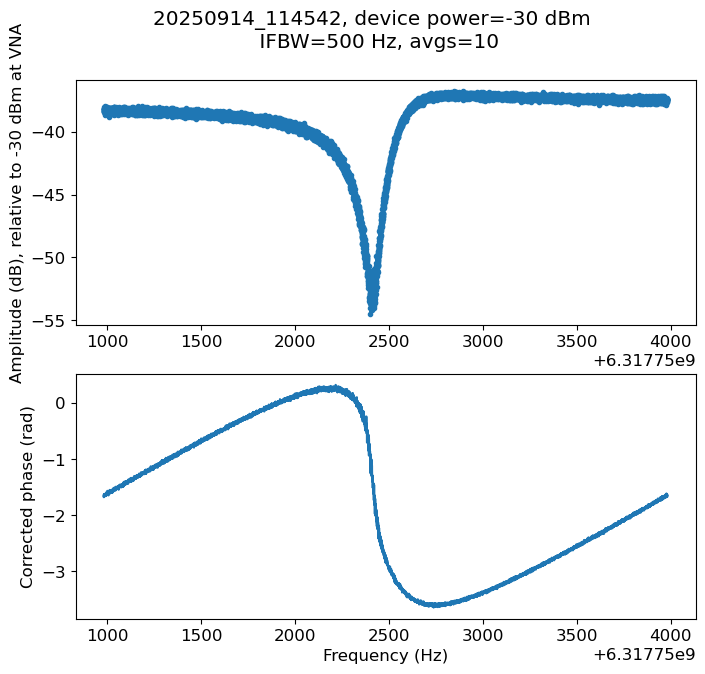

Calculated line delay: 0.06203337303493986


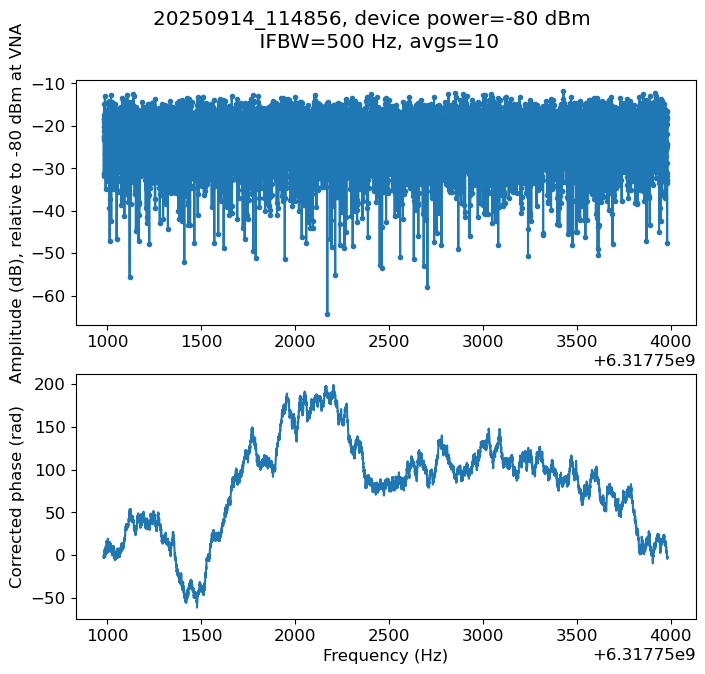

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=540691.2682203995) = 0.0 < max(sigmas)
  warn(errmsg)


Calculated line delay: 0.003967205876034575


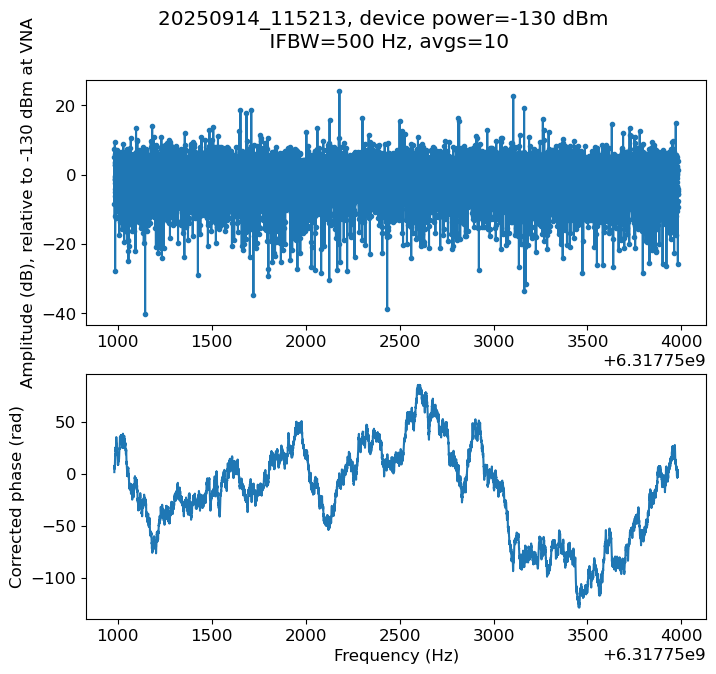

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=226012.08976507187) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=169884.84465585198) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=-1.234243961387607) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -0.0006202513673219615


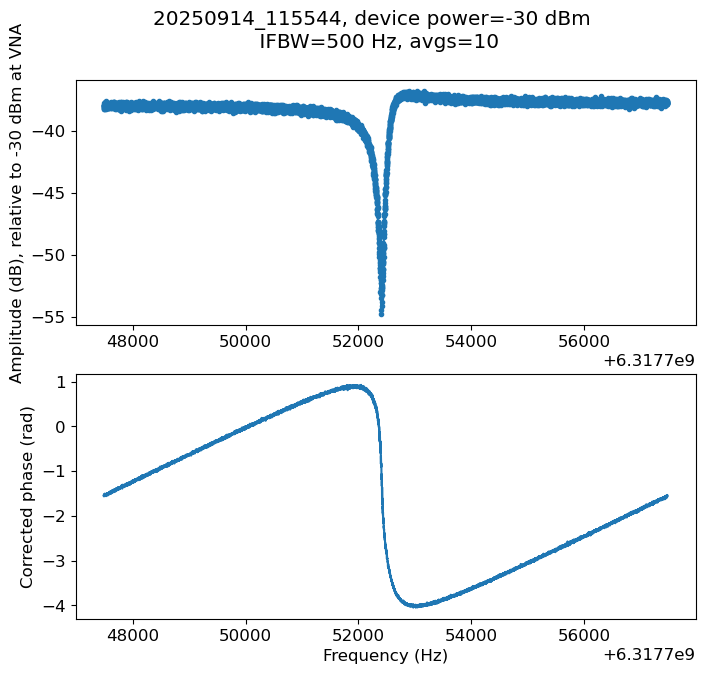

Calculated line delay: -0.027073275696381738


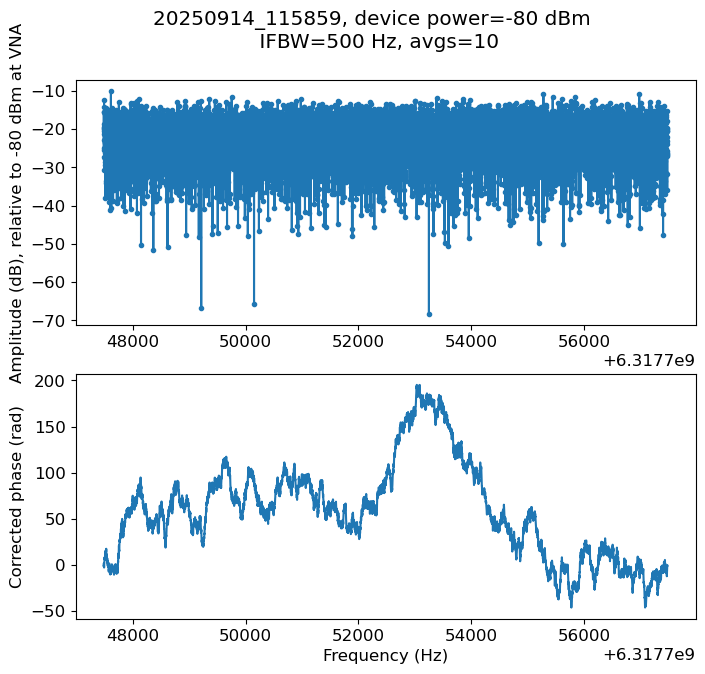

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=96300.32805823206) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=84360.22592362284) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=1.1400805059388397) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: -0.005253900606621352


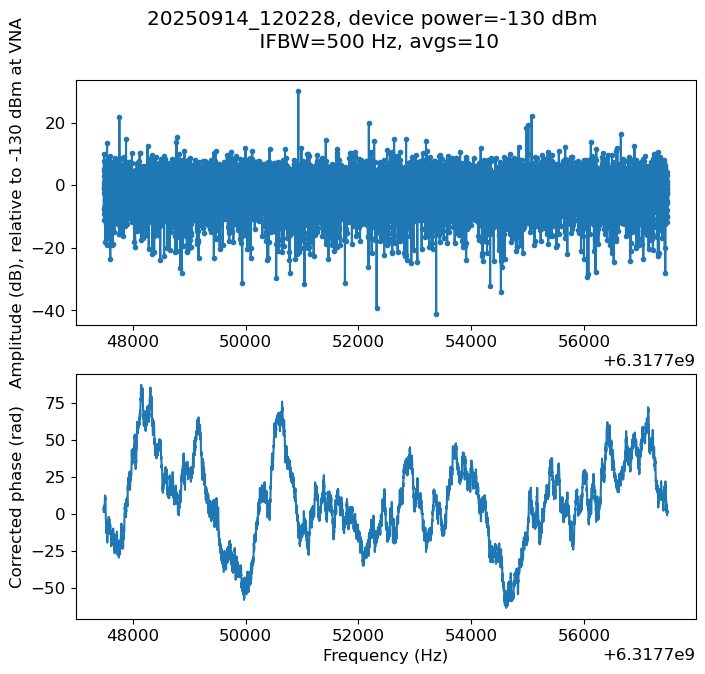

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=26501.11918126457) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=12957.882795771682) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 2.2290165582223627e-05


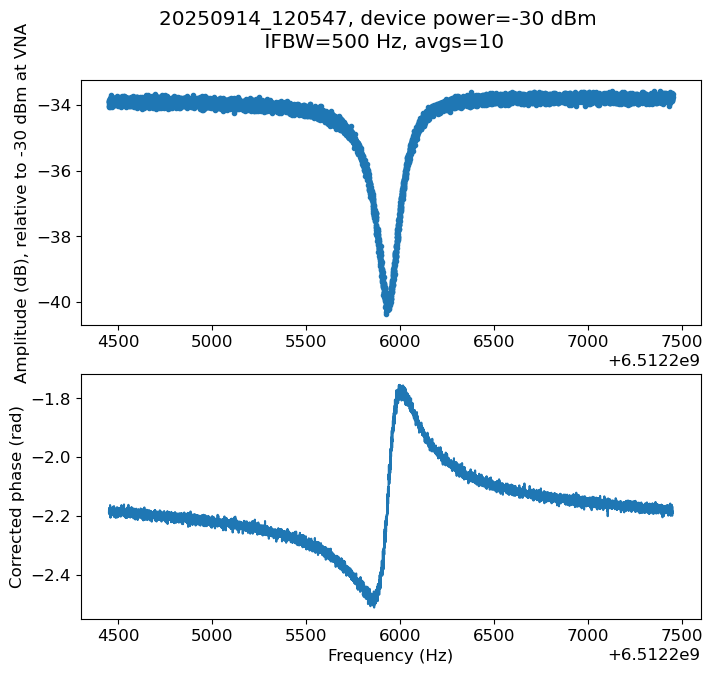

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=116809663.66851844) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][2][1])


Calculated line delay: 0.0382025017477055


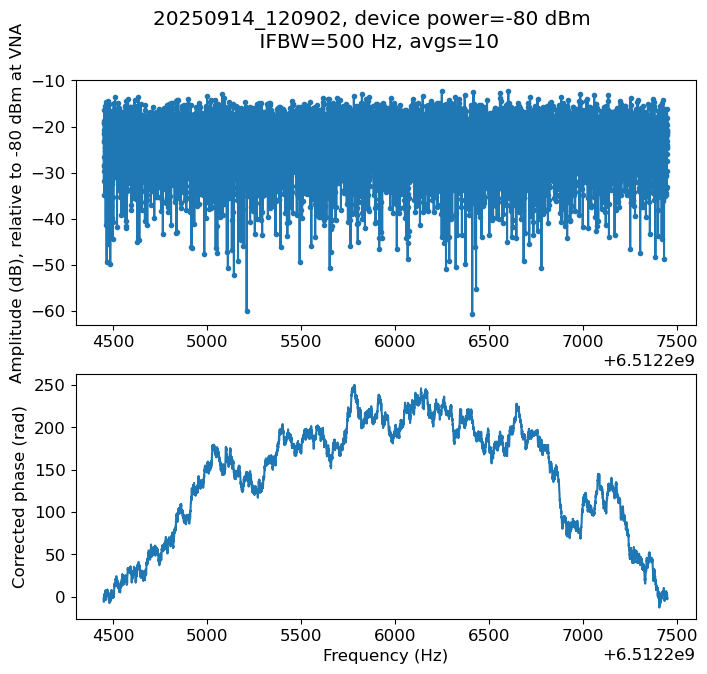

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=768374.2040223655) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 0.09250143431293076


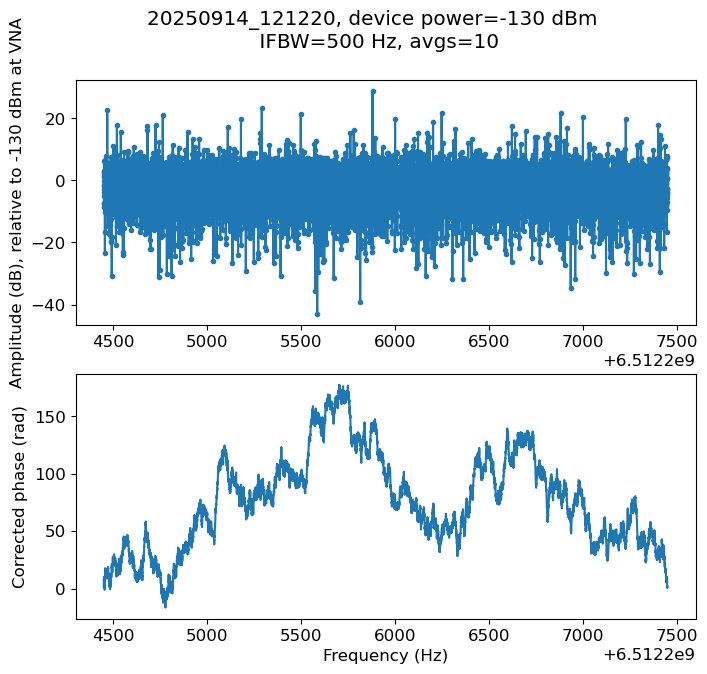

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=875130.7987502262) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=407427.9494801467) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 3.6397942294273277e-06


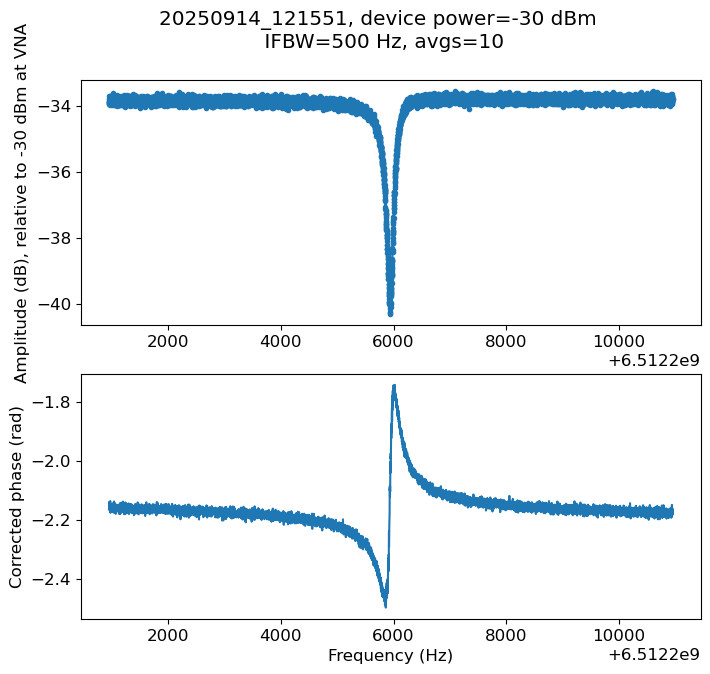

Calculated line delay: 0.001985104187592977


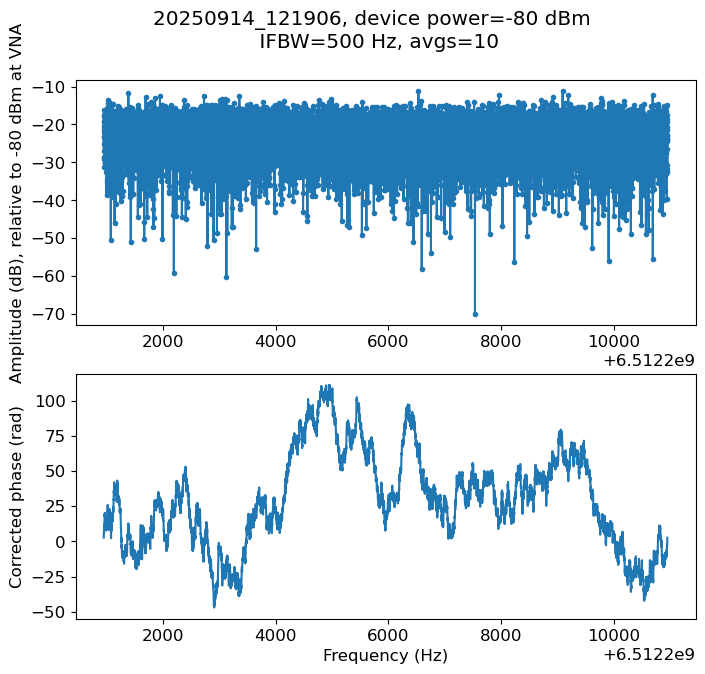

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=1304021.618250461) = 0.08583356416046993 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=7978100.169097764) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=23374.009858335125) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=70122.02957500538) = 0.7332835318378252 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1014: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonato

Calculated line delay: -0.0028734955706295265


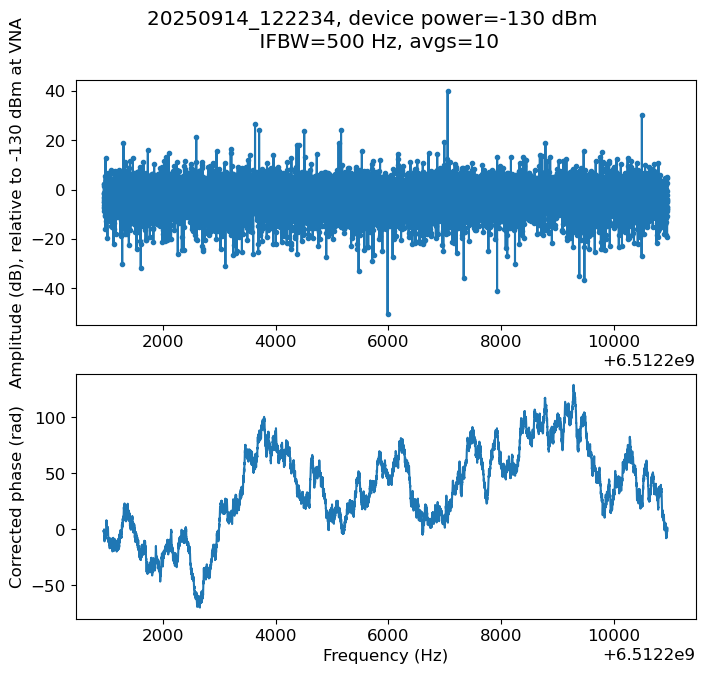

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=4061.54040639972) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=7623.557326179693) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=8079.453503948383) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=6512070213.437701) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=0.15930415030406958) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022:

Calculated line delay: 3.373542630402599e-05


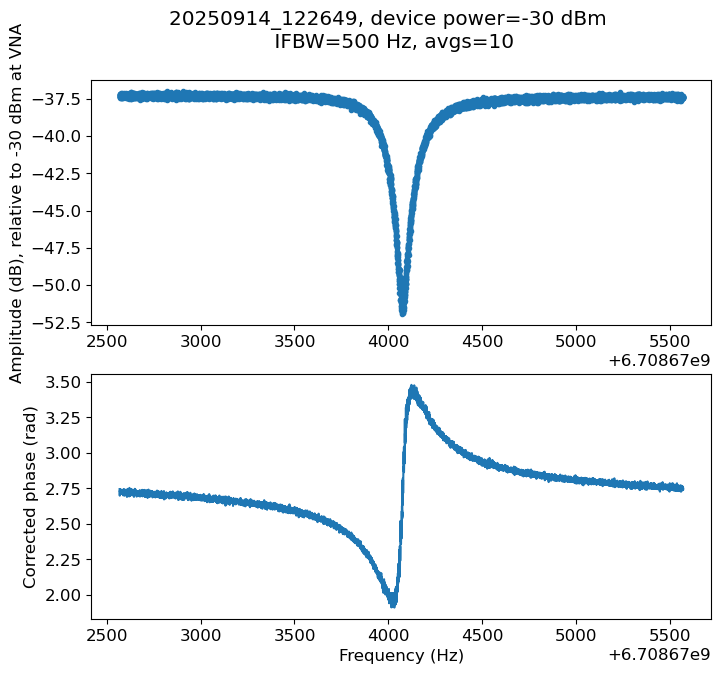

Calculated line delay: -0.1103644719973694


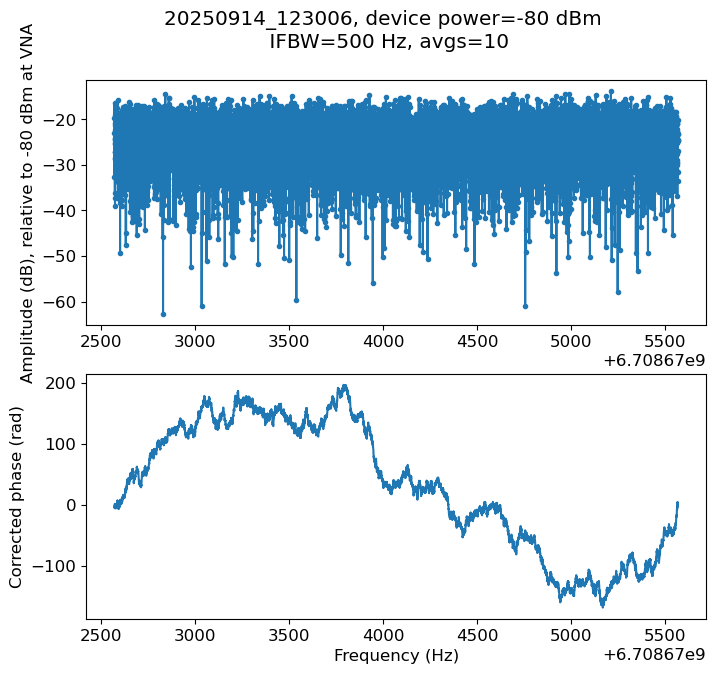

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=154146.45324226652) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=170652.38332663054) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=-0.03219072843773411 < 1e-05 at iteration 4 and prob(w1=6708650063.415516) = 0.7080615991335673 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=6708709214.674714) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=-0.971868807367934) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramDat

Calculated line delay: 0.06674702139710827


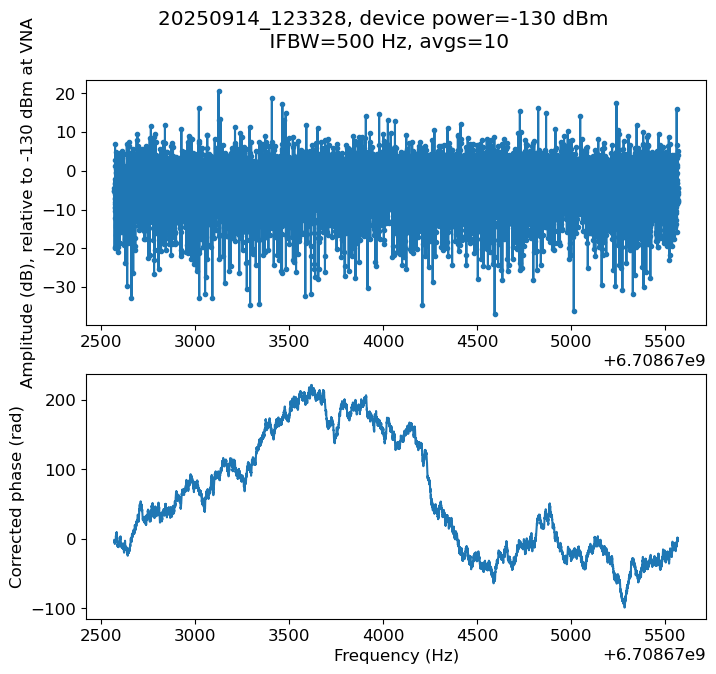

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=459213.9052248786) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 2.8717507153432904e-06


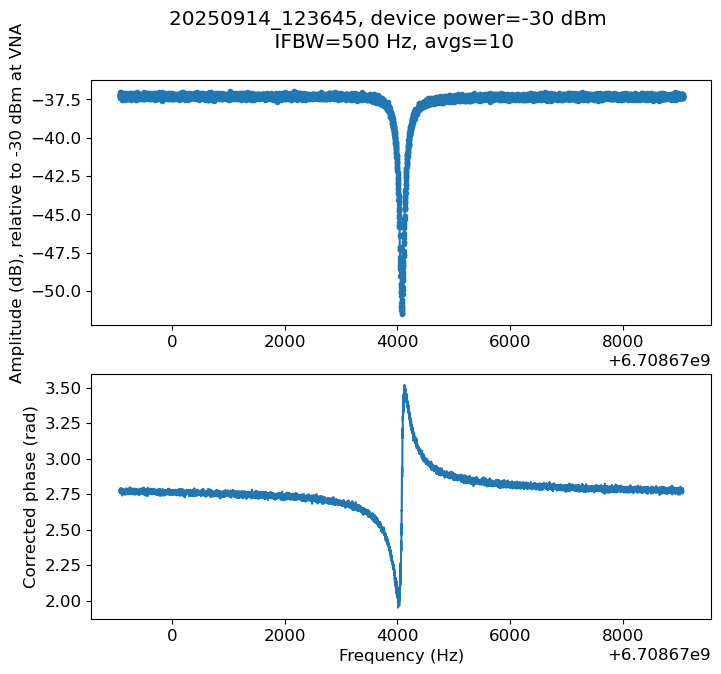

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=27239792.968777265) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=27796822.920511696) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=69456491.65032075) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=70102659.30583821) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=6708674064.455155) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\

Calculated line delay: -0.016629762669656482


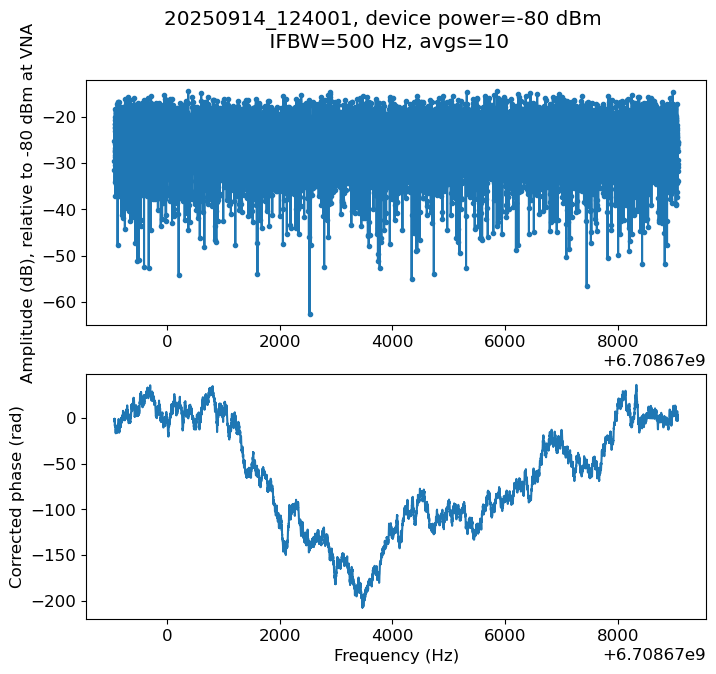

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=-0.04021255140786071 < 1e-05 at iteration 5 and prob(Q=129403.07688891128) = 0.8235098798733481 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=146381.26530908456) = 0.0 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


Calculated line delay: 0.0032306136176298347


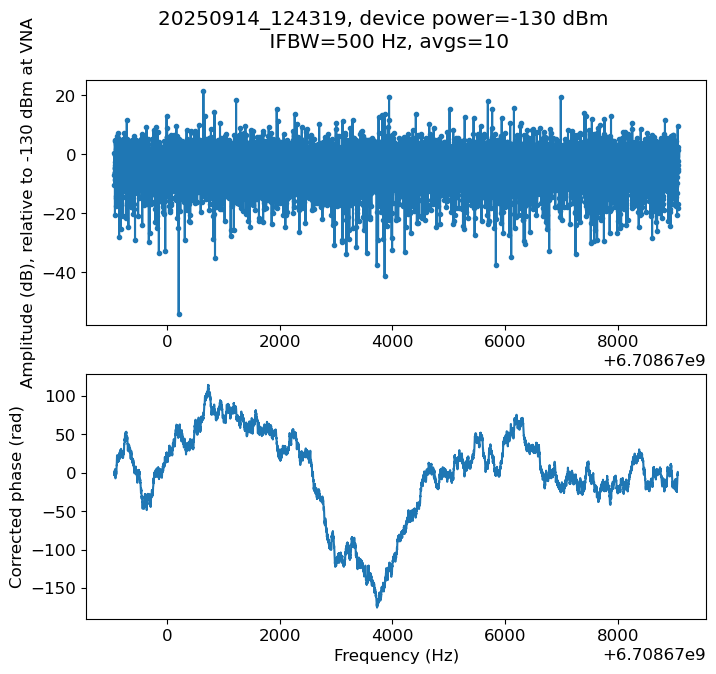

c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=27278.90340582335) = 0.6406017031691129 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=10554.150414556676) = 0.2593732255090058 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=31662.451243670028) = 0.6871290344957119 < max(sigmas)
  warn(errmsg)
C:\_Lib\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (
C:\_Lib\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])
C:\_Lib\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * 

In [118]:
from scresonators.fit_resonator.ana_resonator import ResonatorFitter
import json

mode_freqs = mode_freqs = [4976207000, 5138249900, 5300958000, 5622688300 , 5786404600, 5969312200, 6130556458.122475, 
              6317752481.77095,6512205950.979016,6708674069.282833]

# sweep over spans : 1k, 5k, 10k
# sweep over powers -20, -40, -60, -80
# bandwidth set to 500 
# avgs set to 10
# collect all the datas and the outputs 
spans = [3e3, 10e3]
powers = [-30, -80, -130]
bandwidth = 500
avgs = 10

all_datas = []
all_outputs = []
filename = 'data//250914_fine_sweep'

def serialize_numpy(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    if isinstance(obj, (np.float32, np.float64)):
        return float(obj)
    if isinstance(obj, (np.int32, np.int64)):
        return int(obj)
    return obj

for freq_center in mode_freqs:
    for span in spans:
        for power in powers:
            scan_def = {
                'freq_center': freq_center,
                'span': span,
                'bandwidth': bandwidth,
                'power': power,
                'npoints': 10001,
                'averages': avgs,
                'spar': 'S21'
            }
            file_name = f'sweep_{int(freq_center)}_{int(span)}_{power}dBm'
            data = vna_measurement.do_vna_scan(VNA, file_name, expt_path, scan_def, plot=True)
            all_datas.append({'freq_center': freq_center, 'span': span, 'power': power, 'data': data})
            output = ResonatorFitter.fit_resonator(
                data, file_name, os.getcwd(), plot=False, fix_freq=False, fit_type='DCM REFLECTION'
            )
            all_outputs.append({'freq_center': freq_center, 'span': span, 'power': power, 'output': output})

            # Save after every iteration
            with open(filename + 'all_datas.json', 'w') as f:
                json.dump(all_datas, f, default=serialize_numpy, indent=2)
            with open(filename + 'all_outputs.json', 'w') as f:
                json.dump(all_outputs, f, default=serialize_numpy, indent=2)



In [119]:
all_datas

[{'freq_center': 4976207000,
  'span': 3000.0,
  'power': -30,
  'data': {'series': '20250914_092209',
   'amps': array([-34.8038, -34.3588, -34.5331, ..., -34.6951, -34.5822, -34.7691]),
   'phases': array([-0.1176, -0.14  , -0.1217, ...,  0.1873,  0.2077,  0.2228]),
   'freqs': array([4.9762e+09, 4.9762e+09, 4.9762e+09, ..., 4.9762e+09, 4.9762e+09,
          4.9762e+09]),
   'vna_power': -30,
   'power_at_device': -30,
   'bandwidth': 500,
   'averages': 10,
   'npoints': 10001}},
 {'freq_center': 4976207000,
  'span': 3000.0,
  'power': -80,
  'data': {'series': '20250914_092522',
   'amps': array([-24.7623, -18.2285, -17.7492, ..., -21.2067, -15.3345, -16.0378]),
   'phases': array([-2.5356, -0.5106,  1.4963, ...,  0.8835,  0.7413, -0.8483]),
   'freqs': array([4.9762e+09, 4.9762e+09, 4.9762e+09, ..., 4.9762e+09, 4.9762e+09,
          4.9762e+09]),
   'vna_power': -80,
   'power_at_device': -80,
   'bandwidth': 500,
   'averages': 10,
   'npoints': 10001}},
 {'freq_center': 4976207

In [ ]:
data

[{'freq_center': 4976206800,
  'span': 1000.0,
  'power': -20,
  'data': {'series': '20250912_114709',
   'amps': array([-34.978 , -34.8739, -35.0209, ..., -35.5501, -35.7497, -35.4321]),
   'phases': array([-0.3256, -0.3319, -0.3399, ...,  0.7089,  0.7361,  0.7534]),
   'freqs': array([4.9762e+09, 4.9762e+09, 4.9762e+09, ..., 4.9762e+09, 4.9762e+09,
          4.9762e+09]),
   'vna_power': -20,
   'power_at_device': -20,
   'bandwidth': 500,
   'averages': 10,
   'npoints': 10001}}]

# Sweep (ENA)

In [ ]:
modes = ['M1', 'M2','S1', 'S2', 'S3_1', 'S4', 'S5']
datas_dict = []
for mode in modes:
    file_name = f"{mode}.s2p"
    file_path = base_path + '\\' + file_name
    data = read_s2p_to_data(file_path)
    print(f"Data for {mode}: {data}")
    datas_dict.append(data)


Data for M1: {'series': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 

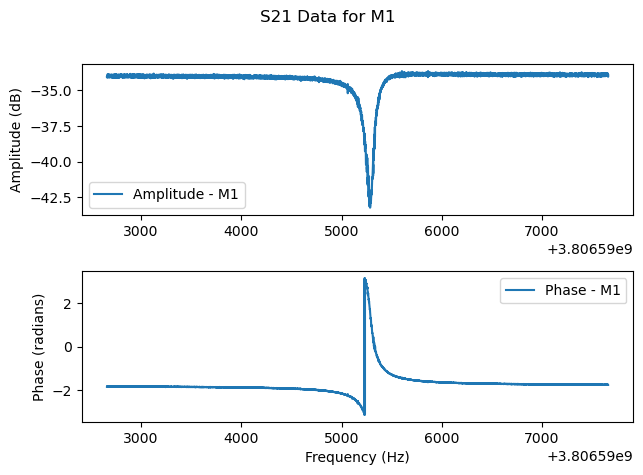

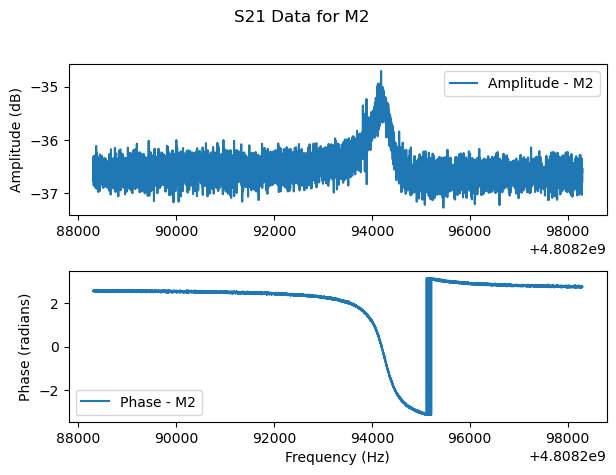

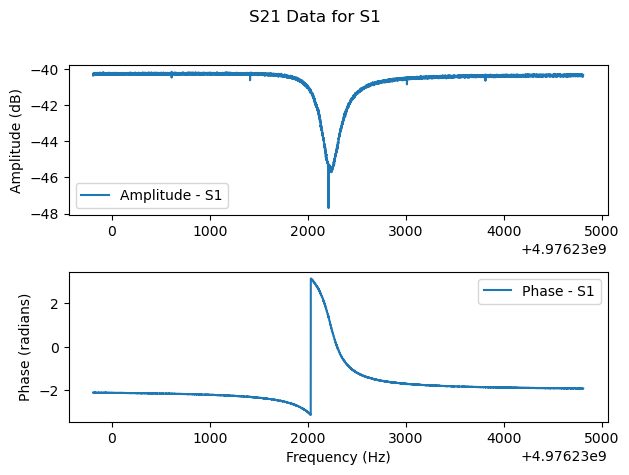

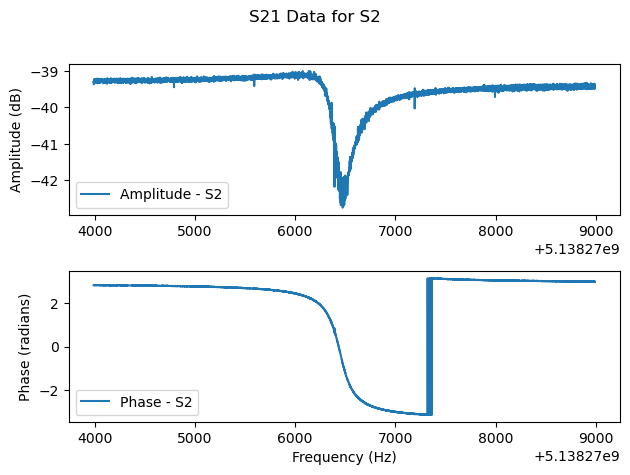

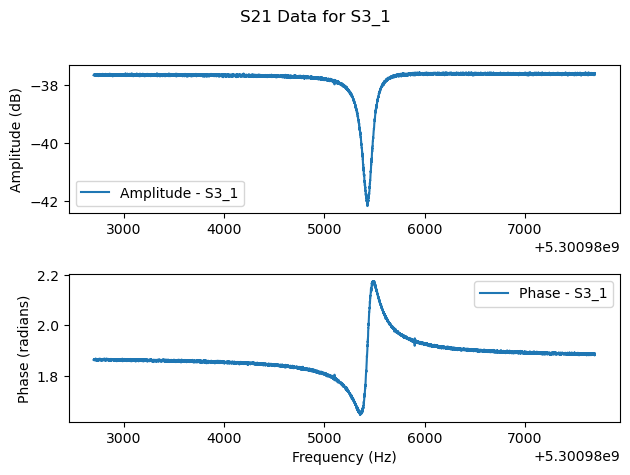

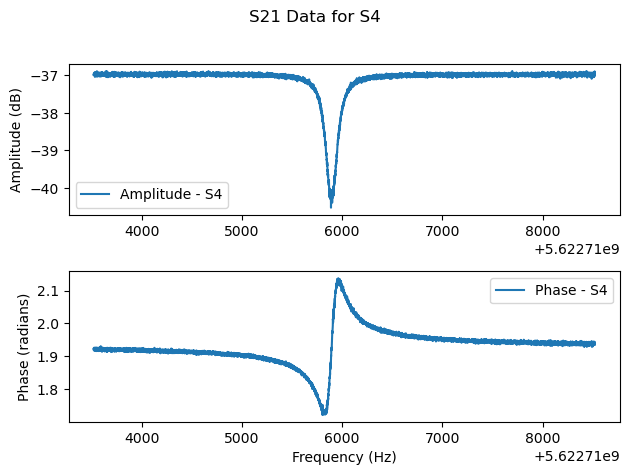

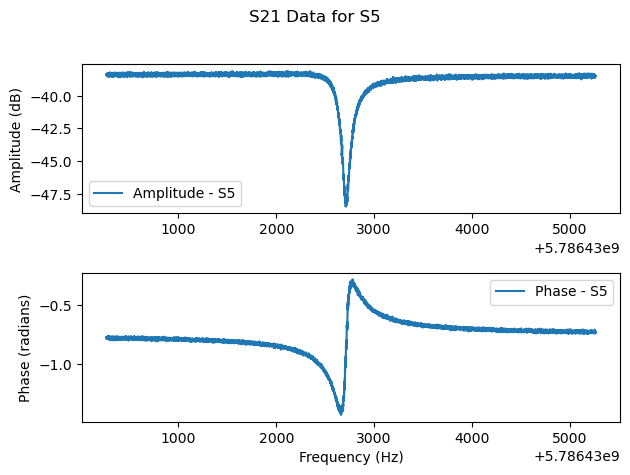

In [ ]:
# Plot for all modes
for mode, data in zip(modes, datas_dict):
    plt.figure()
    plt.suptitle(f"S21 Data for {mode}")
    plt.subplot(2, 1, 1)
    plt.plot(data['freqs'], data['amps'], label=f"Amplitude - {mode}")
    plt.ylabel("Amplitude (dB)")
    plt.legend()
    plt.subplot(2, 1, 2)
    plt.plot(data['freqs'], data['phases'], label=f"Phase - {mode}")
    plt.ylabel("Phase (radians)")
    plt.xlabel("Frequency (Hz)")
    plt.legend()
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

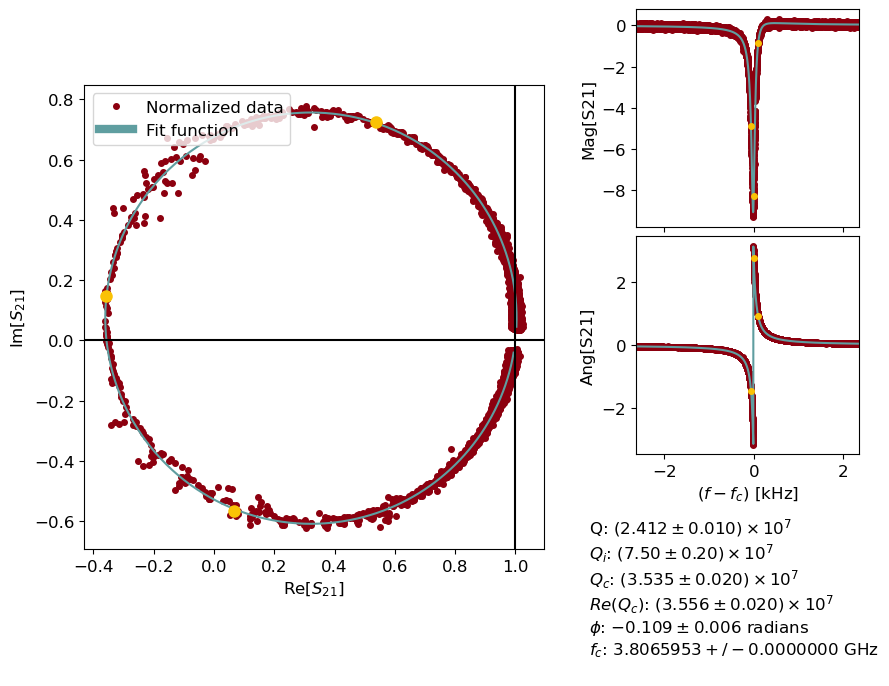

M1: Q = 24.13 million, Qi = 75.96 million, Qc = 35.35 million
([24125491.195627827, 35353843.18448495, 3806595298.551193, -0.10850664086973796], [128866.45981162414, 1993328.4852413684, 169757.92764928937, 170762.19239724427, 0.006133565401731156, 0.41500377655029297], 0.0015956979875771798, [23969171.577565633, 35121734.828657806, 3806595318.0, -0.10677025362082175])


<Figure size 640x480 with 0 Axes>

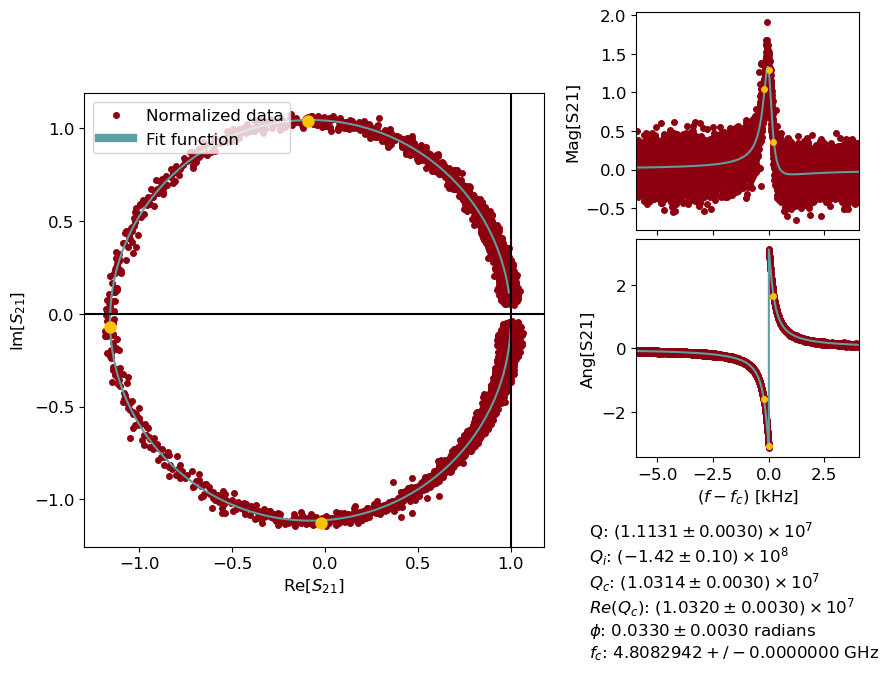

M2: Q = 11.13 million, Qi = -140.58 million, Qc = 10.31 million
([11131480.843337338, 10314740.875558903, 4808294246.982538, 0.03319303633009919], [34120.982546679676, 11543371.256886512, 28409.27439281158, 28424.931932643056, 0.0031571740290832, 0.5795745849609375], 0.0015315400901367785, [10969835.754782617, 10186391.25090719, 4808294243.0, 0.033554327089707243])


c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=15433425.831020173) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=15462982.219843704) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=19877500.684619155) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=19905934.583424326) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=4976232218.327782) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda

>Error when trying to write parameters on plot
>cannot convert float infinity to integer
S1: Q = 15.45 million, Qi = 69.16 million, Qc = 19.89 million
([15448204.025431938, 19891717.63402174, 4976232218.4937105, 0.045092135357047654], [inf, inf, inf, inf, 0.0006278816528248396, 0.08080577850341797], 0.0005494521371604079, [15836843.988782499, 20302498.415242355, 4976232222.0, 0.046566087686052526])


c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=20996551.435262527) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=24338388.395554673) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5138276433.636708) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=0.09286666658249725) = 0.0 < max(sigmas)
  warn(errmsg)


>Error when trying to write parameters on plot
>cannot convert float infinity to integer
S2: Q = 21.03 million, Qi = 153.70 million, Qc = 24.36 million
([21028597.153345563, 24361590.971030198, 5138276433.421937, 0.09414286438166458], [inf, 174030444.01605317, 35138.16844141483, 35294.45821353793, 0.0012302855232417392, 0.1540822982788086], 0.000784958477134247, [21043144.907366246, 24376773.14352327, 5138276434.0, 0.09678350875396817])


c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=33809202.33718843) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=168224680.45190257) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=168783910.85071456) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5300985436.999007) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5300985438.326032) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3

>Error when trying to write parameters on plot
>cannot convert float infinity to integer
S3_1: Q = 33.99 million, Qi = 42.58 million, Qc = 168.50 million
([33993763.31512122, 168504295.65130857, 5300985437.662519, -0.15109861510223546], [inf, inf, inf, inf, 3.141592653589793, inf], 0.00033129137770288356, [35476025.858214125, 174076280.7332872, 5300985431.0, -0.14720236337034018])


c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=33642778.373554654) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=34283069.395009674) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=210186921.3210788) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=211432095.7728887) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5622715893.251175) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\

>Error when trying to write parameters on plot
>cannot convert float infinity to integer
S4: Q = 33.96 million, Qi = 40.49 million, Qc = 210.81 million
([33962923.884282164, 210809508.54698375, 5622715892.061865, 0.029984123029159638], [inf, inf, inf, inf, 0.008464700717288425, 0.5503005981445312], 0.0004546688681225162, [35909313.343642525, 219699260.68760976, 5622715889.0, 0.014081824623738009])


c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Q=29377878.458787475) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=85851765.40204914) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Qc=86267792.17852075) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(w1=5786432698.165766) = 0.0 < max(sigmas)
  warn(errmsg)
c:\ProgramData\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=0.20303396019948292) = 0.0 < max(sigmas)
  warn(errmsg)


>Error when trying to write parameters on plot
>cannot convert float infinity to integer
S5: Q = 29.55 million, Qi = 45.00 million, Qc = 86.06 million
([29548363.102390684, 86059778.79028495, 5786432697.408665, 0.20772582360630137], [inf, inf, inf, inf, 0.002274427508120125, 0.11679744720458984], 0.00075797265217717, [29342004.172841627, 85563901.5976761, 5786432696.0, 0.2110339164585758])


<Figure size 640x480 with 0 Axes>

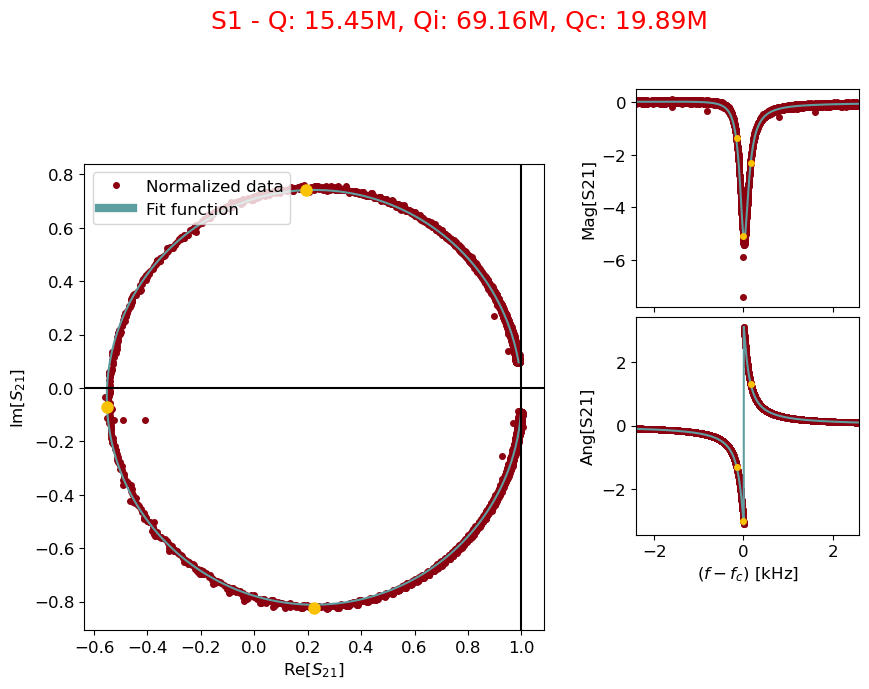

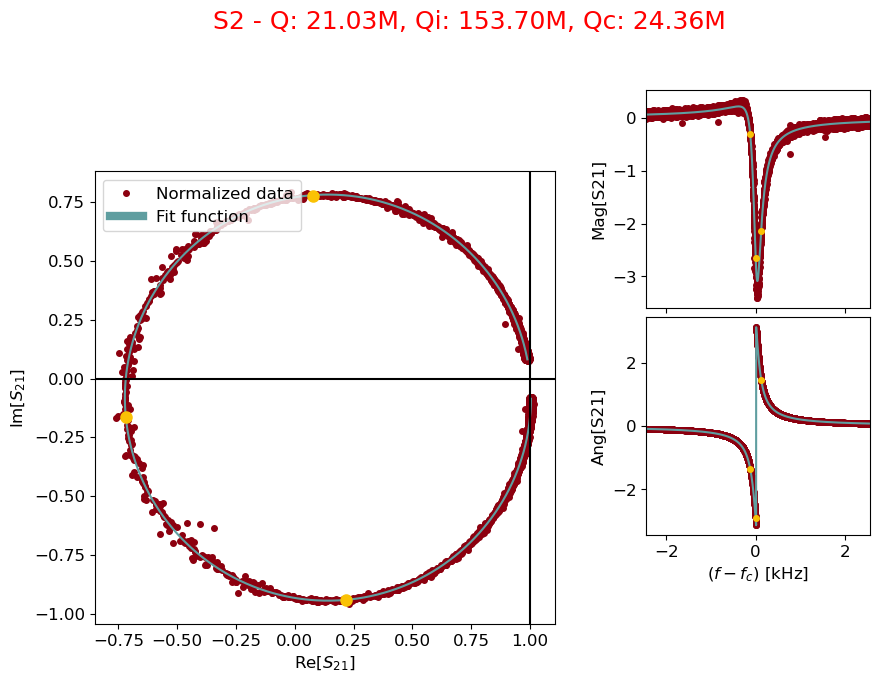

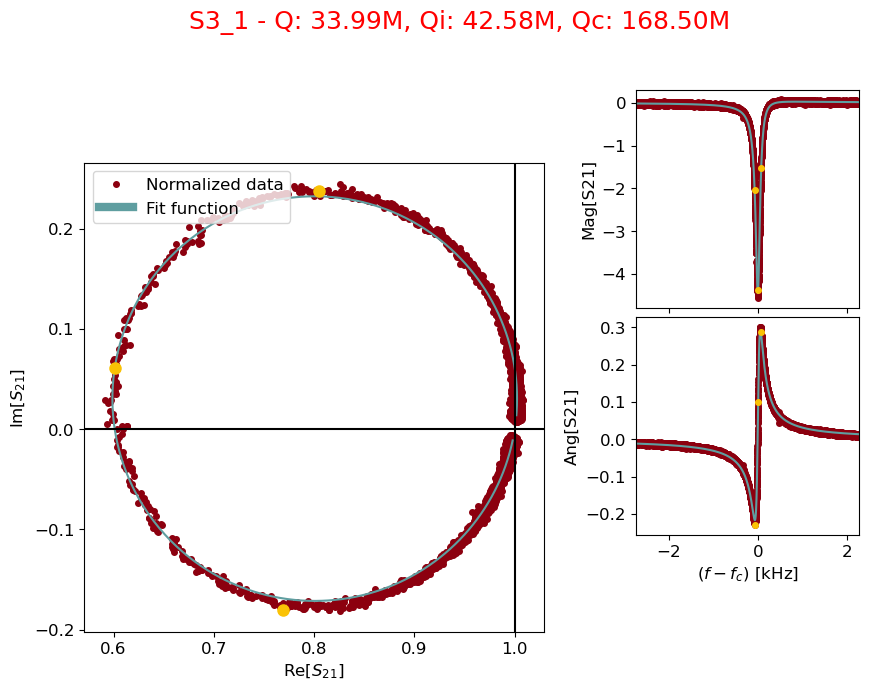

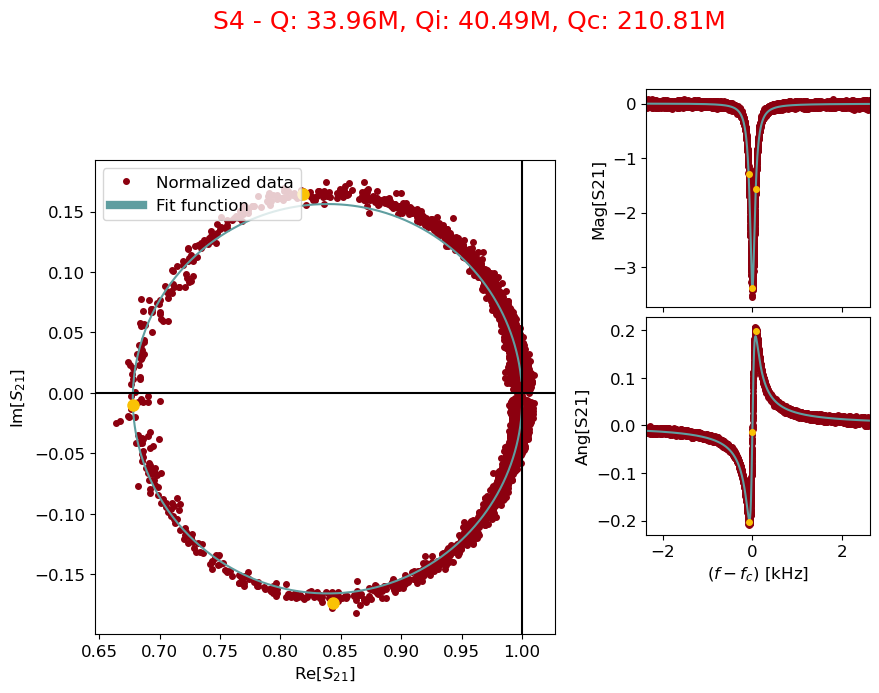

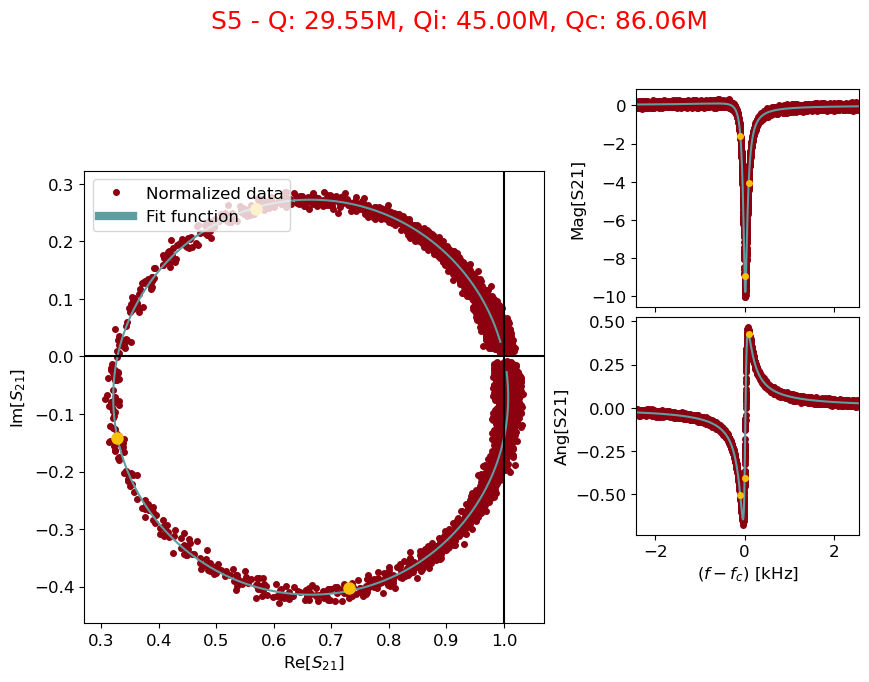

In [ ]:
from scresonators.fit_resonator.ana_resonator import ResonatorFitter


for mode, data in zip(modes, datas_dict):
    output = ResonatorFitter.fit_resonator(
        data, mode, os.getcwd(), plot=True, fix_freq=False, fit_type='DCM REFLECTION'
    )
    Q, Qc, frequency, phase = output[0]
    Qi = 1 / (1/Q - 1/Qc)
    print(f"{mode}: Q = {Q/1e6:.2f} million, Qi = {Qi/1e6:.2f} million, Qc = {Qc/1e6:.2f} million")
    # Add Q, Qi and Qc as big text on the plot
    plt.gcf().suptitle(f"{mode} - Q: {Q/1e6:.2f}M, Qi: {Qi/1e6:.2f}M, Qc: {Qc/1e6:.2f}M", fontsize=18, color='red')
    plt.draw()
    file_path_for_saving= base_path + '\\plots\\'
    plt.savefig(f"{file_path_for_saving}{mode}_fit.png")
    # plt.pause(0.1)
    print(output)

# Quick Search # ENA

In [ ]:
file_name = 'R1_2.s2p'
file_path = base_path + '\\' + file_name
# read the s2p file
'''
the s2p file has the follwing header 
!Agilent Technologies,E5071C,MY46110978,A.11.31
!Date: Thu Sep 11 07:08:37 2025
!Data & Calibration Information:
!Freq	S11:NONE(--)	S21:NONE(--)	S12:NONE(--)	S22:NONE(--)
!PortZ  Port1:50+j0    Port2:50+j0
!Above PortZ is port z conversion or system Z0 setting when saving the data.
!When reading, reference impedance value at option line is always used.
# Hz S dB R 50

I want to get frequency,amp and phase from this file 
'''
s2p_data = []
with open(file_path, 'r') as f:
    s2p_data = f.readlines()
# Parse s2p_data to extract frequency, amplitude (dB), and phase (degrees) for S21
freqs = []
amps = []
phases = []
for line in s2p_data:
    if line.startswith('!') or line.startswith('#'):
        continue
    parts = line.strip().split()
    if len(parts) >= 5:
        freq = float(parts[0])
        amp = float(parts[3])  # S21 amplitude in dB
        phase = float(parts[4])  # S21 phase in degrees
        freqs.append(freq)
        amps.append(amp)
        phases.append(phase)

freqs = np.array(freqs)
amps = np.array(amps)
phases = np.array(phases)

# now the fitter function expects the follwoing dictionary 
'''data = {
            "series": [_ for i in range(len(df_amps['Frequency']))],
            "amps": np.array(df_amps[' Formatted Data']),
            "phases": np.array(df_phase[' Formatted Data'])*np.pi/180,
            "freqs": np.array(df_amps['Frequency']),
            "vna_power": None,
            "power_at_device": -50,
            "bandwidth": None,
            "averages": None,
            "npoints": len(df_amps[' Formatted Data']),
        }'''
# make this for data above
data = {
    "series": list(range(len(freqs))),
    "amps": amps,
    "phases": phases * np.pi / 180,  # convert degrees to radians
    "freqs": freqs,
    "vna_power": None,
    "power_at_device": -50,
    "bandwidth": None,
    "averages": None,
    "npoints": len(freqs),
}

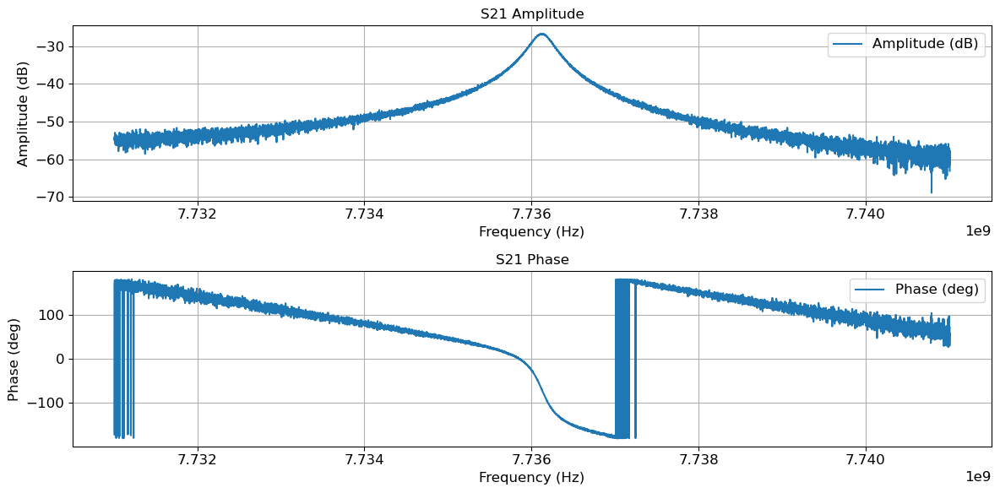

In [ ]:
# plot the freqs amps and phases
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(freqs, amps, label='Amplitude (dB)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude (dB)')
plt.title('S21 Amplitude')
plt.grid(True)
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(freqs, phases, label='Phase (deg)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase (deg)')
plt.title('S21 Phase')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


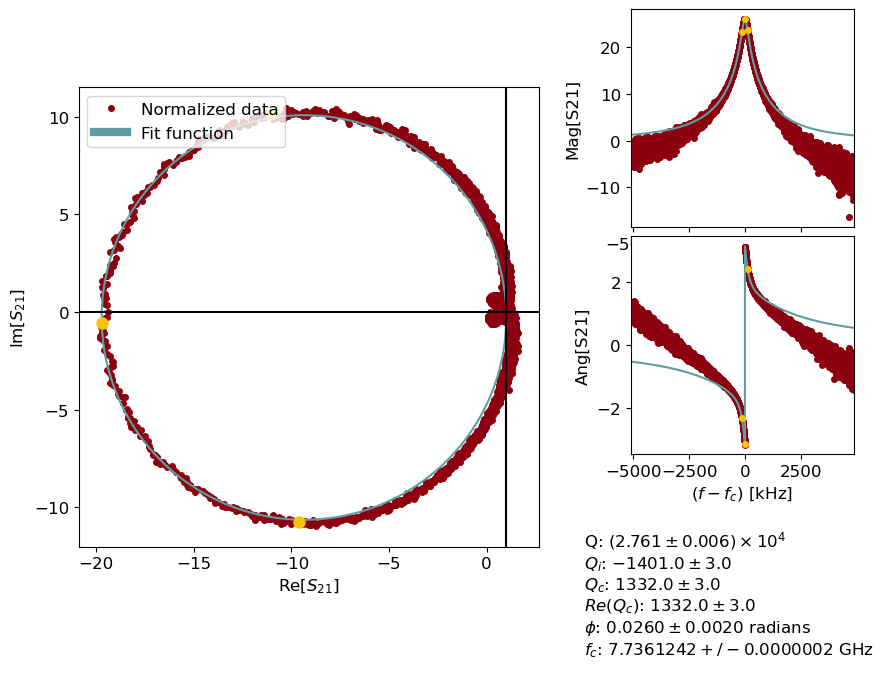

Qi: -0.00 million


In [ ]:
from scresonators.fit_resonator.ana_resonator import ResonatorFitter
output = ResonatorFitter.fit_resonator(data, 'try1', os.getcwd(), plot=True, fix_freq=False, fit_type='DCM' # note for reflection should be set to 'DCM REFLECTION'
        )

# the output contains 
'''Tuple containing:
            - List of fit parameters [Q, Qc, frequency, phase]
            - List of parameter errors'''
# can you use the equation 1/Q = 1/Qc + 1/Qi to extract Qi and print
Q, Qc, frequency, phase = output[0]
Qi = 1 / (1/Q - 1/Qc)
print(f"Qi: {Qi/1e6:.2f} million")